# CIV1498 - Introduction to Data Science
## Project - Bike Share Toronto
## Part 2 - Exploratory Data Analysis

Table of contents

1.   Usage trends from 2017 to 2020
2.   Behavior of annual and casual members
3.   Analysis of neighbourhoods and bikeshare stations
4.   Patterns in trip duration
5.   Effects of weather
6.   Effects of proximity to TTC subway stations
7.   Impact of COVID



## Setup Notebook

In [ ]:
# Import 3rd party libraries
import os
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import numpy as np
import pandas as pd
!pip install geopandas
import geopandas as gpd
import folium

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

     |████████████████████████████████| 1.0MB 4.4MB/s 
     |████████████████████████████████| 6.5MB 12.3MB/s 
     |████████████████████████████████| 15.3MB 254kB/s 


## Load data

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# Load merged data
data_merged = pd.read_csv('/content/drive/My Drive/CIV1498 Project 2021/data_merged.csv', index_col = 0)
data_merged.head()

,Trip Id,Trip Duration,Start Station Id,Start Time,Start Station Name,End Station Id,End Time,End Station Name,User Type,Start_lat,Start_lon,Start_capacity,End_lat,End_lon,End_capacity,Temp (°C),Dew Point Temp (°C),Rel Hum (%),Wind Dir (10s deg),Wind Spd (km/h),Visibility (km),Hmdx,Wind Chill,Weather
0,712441,274,7006.0,2017-01-01 00:00:00-05:00,Bay St / College St (East Side),7021.0,2017-01-01 00:08:00-05:00,Bay St / Albert St,Member,43.660439,-79.385525,11,43.653264,-79.382458,35,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
90955,712439,453,7026.0,2017-01-01 00:00:00-05:00,Bay St / St. Joseph St,7027.0,2016-12-31 23:58:00-05:00,Beverley St / Dundas St W,Member,43.665527,-79.387499,15,43.652823,-79.393388,31,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
969587,712445,645,7076.0,2017-01-01 00:00:00-05:00,York St / Queens Quay W,7010.0,2017-01-01 00:25:00-05:00,King St W / Spadina Ave,Member,43.640132,-79.380464,27,43.645323,-79.395003,19,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
1453301,712431,494,7163.0,2017-01-01 00:00:00-05:00,Yonge St / Wood St,7634.0,2016-12-31 23:51:00-05:00,University Ave / Gerrard St W (West Side),Member,43.662222,-79.382500,15,43.657845,-79.389927,18,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
1453302,712432,425,7163.0,2017-01-01 00:00:00-05:00,Yonge St / Wood St,7634.0,2016-12-31 23:50:00-05:00,University Ave / Gerrard St W (West Side),Member,43.662222,-79.382500,15,43.657845,-79.389927,18,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear


# 1 Usage trends from 2017 to 2020

## 1.1 Generate monthly rides

In [ ]:
# Set trip start datetime as index 
data_merged2 = data_merged.copy()
data_merged2.index = pd.to_datetime(data_merged2['Start Time'])
data_merged2.head()

,Trip Id,Trip Duration,Start Station Id,Start Time,Start Station Name,End Station Id,End Time,End Station Name,User Type,Start_lat,Start_lon,Start_capacity,End_lat,End_lon,End_capacity,Temp (°C),Dew Point Temp (°C),Rel Hum (%),Wind Dir (10s deg),Wind Spd (km/h),Visibility (km),Hmdx,Wind Chill,Weather
Start Time,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00-05:00,712441,274,7006.0,2017-01-01 00:00:00-05:00,Bay St / College St (East Side),7021.0,2017-01-01 00:08:00-05:00,Bay St / Albert St,Member,43.660439,-79.385525,11,43.653264,-79.382458,35,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
2017-01-01 00:00:00-05:00,712439,453,7026.0,2017-01-01 00:00:00-05:00,Bay St / St. Joseph St,7027.0,2016-12-31 23:58:00-05:00,Beverley St / Dundas St W,Member,43.665527,-79.387499,15,43.652823,-79.393388,31,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
2017-01-01 00:00:00-05:00,712445,645,7076.0,2017-01-01 00:00:00-05:00,York St / Queens Quay W,7010.0,2017-01-01 00:25:00-05:00,King St W / Spadina Ave,Member,43.640132,-79.380464,27,43.645323,-79.395003,19,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
2017-01-01 00:00:00-05:00,712431,494,7163.0,2017-01-01 00:00:00-05:00,Yonge St / Wood St,7634.0,2016-12-31 23:51:00-05:00,University Ave / Gerrard St W (West Side),Member,43.662222,-79.382500,15,43.657845,-79.389927,18,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear
2017-01-01 00:00:00-05:00,712432,425,7163.0,2017-01-01 00:00:00-05:00,Yonge St / Wood St,7634.0,2016-12-31 23:50:00-05:00,University Ave / Gerrard St W (West Side),Member,43.662222,-79.382500,15,43.657845,-79.389927,18,1.5,-3.6,69.0,26.0,39.0,16.1,NaN,NaN,Clear


In [ ]:
# Get monthly rides
data_months = data_merged2.groupby(pd.Grouper(freq='M')).agg(rides = ('Trip Id', 'count'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual'))))
data_months.head()

,rides,annual_members,casual_members
Start Time,,,
2017-01-31 00:00:00-05:00,40592,39356,1236
2017-02-28 00:00:00-05:00,40376,38312,2064
2017-03-31 00:00:00-05:00,47745,45825,1920
2017-04-30 00:00:00-05:00,73213,62913,10300
2017-05-31 00:00:00-05:00,98167,82832,15335


In [ ]:
# Quick sanity check of monthly data
print('Total rides from data_months: {}'.format(data_months['rides'].sum()))
print('Total rides from data_merged: {}'.format(len(data_merged)))
print('Annual rides + casual rides = {}'.format(data_months['annual_members'].sum()+data_months['casual_members'].sum()))

Total rides from data_months: 8007533
Total rides from data_merged: 8007533
Annual rides + casual rides = 8007533


In [ ]:
# Since there is very few data for Nov. 2020, drop the last row of data_months
data_months = data_months.iloc[0:-1]

## 1.2 Plot monthly rides

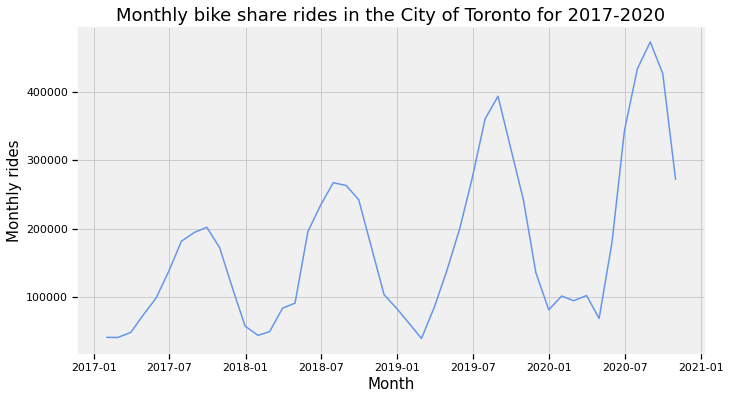

In [ ]:
# Plot daily rides - total
plt.figure(figsize=(10, 6))
plt.title('Monthly bike share rides in the City of Toronto for 2017-2020', fontsize = 18)
ax = sns.lineplot(data_months.index, data_months['rides'], color="cornflowerblue")
plt.xlabel('Month', fontsize=15)
plt.ylabel('Monthly rides', fontsize=15)
plt.show()

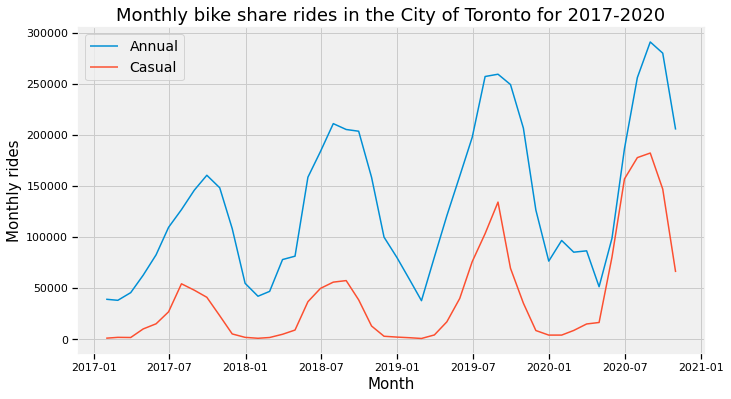

In [ ]:
# Plot daily counts - annual vs. casual members
plt.figure(figsize=(10, 6))
plt.title('Monthly bike share rides in the City of Toronto for 2017-2020', fontsize=18)
sns.lineplot(data_months.index, data_months['annual_members'], label = 'Annual')
sns.lineplot(data_months.index, data_months['casual_members'], label = 'Casual')
plt.xlabel('Month', fontsize=15)
plt.ylabel('Monthly rides', fontsize=15)
plt.legend(fontsize = 14)
plt.show()

- The bike usage has an increasing trend from 2017 to 2020 for both annual and casual members.
- A seasonal cyclic behavior can be observed where much more usage happens during summer and autumn.
- Usage by casual members is always below that of annual members except for June and July of 2020 during which the demand of the two types of members are close to each other.

# 2 Behavior of annual and casual members

## 2.1 Analysis of Daily rides

### 2.1.1 Generate daily rides

In [ ]:
# Get daily rides for annual and casual members
data_days = data_merged2.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual'))),
                                                           workday = ('Start Time', lambda x: pd.to_datetime(x[0]).weekday() < 5))
data_days.head()

,rides,annual_members,casual_members,workday
Start Time,,,,
2017-01-01 00:00:00-05:00,477,409,68,False
2017-01-02 00:00:00-05:00,799,740,59,True
2017-01-03 00:00:00-05:00,862,844,18,True
2017-01-04 00:00:00-05:00,1378,1344,34,True
2017-01-05 00:00:00-05:00,1186,1167,19,True


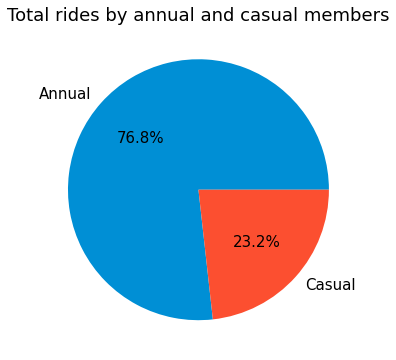

In [ ]:
# Pie chart for annual and casual member usage
plt.figure(figsize = (10,6))
plt.title('Total rides by annual and casual members', fontsize=18)
patches, texts, autotexts = plt.pie([data_days['annual_members'].sum(),data_days['casual_members'].sum()], labels = ['Annual','Casual'],autopct='%1.1f%%')
[text.set_fontsize(15) for text in texts]
[text.set_fontsize(15) for text in autotexts]
plt.show()

We also care about daily rides of special days including **statutory holidays** and **"Free Ride Wednesday"**. The dates of the special days are specified below:

Statutory holidays: New Year's Day, Family Day, Good Friday, Victoria Day, Canada Day, Civic Holiday, Labour Day, Thanksgiving, Christmas Day, Boxing Day

For some cases, the specific date of a holiday is adjusted to Monday of the long weekend.

In [ ]:
statutory_holidays = ['2017-01-02', '2017-02-20', '2017-04-14', '2017-05-22', '2017-07-03', '2017-08-07', '2017-09-04', '2017-10-09', '2017-12-25', '2017-12-26',
                      '2018-01-01', '2018-02-19', '2018-03-30', '2018-05-21', '2018-07-02', '2018-08-06', '2018-09-03', '2018-10-08', '2018-12-25', '2018-12-26',
                      '2019-01-01', '2019-02-18', '2019-04-19', '2019-05-20', '2019-07-01', '2019-08-05', '2019-09-02', '2019-10-14', '2019-12-25', '2019-12-26',
                      '2020-01-01', '2020-02-17', '2020-04-10', '2020-05-18', '2020-07-01', '2020-08-03', '2020-09-07', '2020-10-12', '2020-12-25', '2020-12-28']

Dates of **Free Ride Wednesday**

Source: [2017](https://bikesharetoronto.com/news/mayor-john-tory-bike-share-toronto-roll-free-ride-wednesdays-july/#:~:text=Get%20The%20App-,Mayor%20John%20Tory%20and%20Bike%20Share%20Toronto,Free%20Ride%20Wednesdays%20in%20July&text=TORONTO%2C%20June%2023%2C%202017%20%E2%80%93,in%20the%20month%20of%20July), [2018](https://bikesharetoronto.com/news/free-ride-wednesday-2018/#:~:text=On%20May%2030th%2C%202018%2C%20Mayor,enjoy%20unlimited%2030%2Dminute%20rides), [2019](https://bikesharetoronto.com/news/free-ride-wednesdays-is-back/), [2020](https://bikesharetoronto.com/news/free-ride-wednesdays-are-back-and-e-bikes-are-joining-the-fleet/#:~:text=TORONTO%2C%20August%2019%2C%202020%20%E2%80%93,the%20return%20of%20Free%20Ride)


In [ ]:
free_ride_wed = ['2017-07-05', '2017-07-12', '2017-07-19', '2017-07-26',
                 '2018-06-06', '2018-06-13', '2018-06-20', '2018-06-27',
                 '2019-08-07', '2019-08-14', '2019-08-21', '2019-08-28',
                 '2020-09-02', '2020-09-09', '2020-09-16', '2020-09-23', '2020-09-30']

In [ ]:
# Add two columns in data_days to identify special days
data_days['statutory_holidays'] = data_days.apply(lambda x: x.name.strftime("%Y-%m-%d") in statutory_holidays, axis=1)
data_days['free_ride_wed'] = data_days.apply(lambda x: x.name.strftime("%Y-%m-%d") in free_ride_wed, axis=1)
data_days.head()

,rides,annual_members,casual_members,workday,statutory_holidays,free_ride_wed
Start Time,,,,,,
2017-01-01 00:00:00-05:00,477,409,68,False,False,False
2017-01-02 00:00:00-05:00,799,740,59,True,True,False
2017-01-03 00:00:00-05:00,862,844,18,True,False,False
2017-01-04 00:00:00-05:00,1378,1344,34,True,False,False
2017-01-05 00:00:00-05:00,1186,1167,19,True,False,False


In [ ]:
# Quick sanity check of daily data
print('Total rides from data_days: {}'.format(data_days['rides'].sum()))
print('Total rides from data_merged: {}'.format(len(data_merged)))
print('Annual rides + casual rides = {}'.format(data_days['annual_members'].sum()+data_days['casual_members'].sum()))

Total rides from data_days: 8007533
Total rides from data_merged: 8007533
Annual rides + casual rides = 8007533


Since there are very few casual member usage between November and April, daily data between May and October will be used for this section.

In [ ]:
# Daily data for May-Oct.
data_days_MaytoOct = data_days[data_days.index.month.isin(range(5, 11))]
data_days_MaytoOct.head()

,rides,annual_members,casual_members,workday,statutory_holidays,free_ride_wed
Start Time,,,,,,
2017-05-01 00:00:00-05:00,1540,1465,75,True,False,False
2017-05-02 00:00:00-05:00,2626,2492,134,True,False,False
2017-05-03 00:00:00-05:00,3766,3359,407,True,False,False
2017-05-04 00:00:00-05:00,1883,1742,141,True,False,False
2017-05-05 00:00:00-05:00,735,721,14,True,False,False


### 2.1.2 Distribution of daily rides

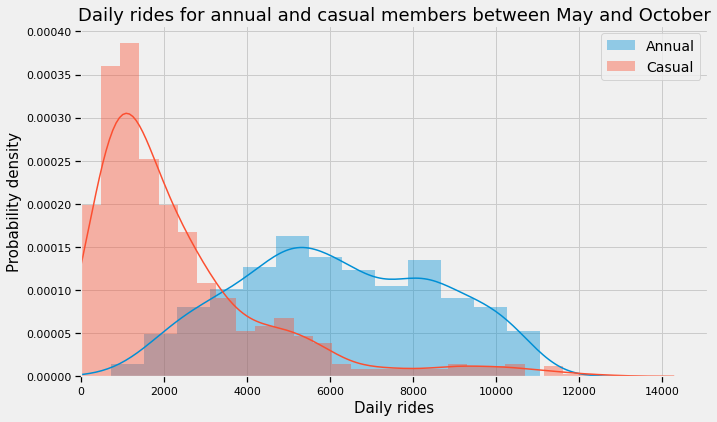

In [ ]:
# Plot distribution of daily rides between May and October
plt.subplots(figsize = (10,6))
sns.distplot(data_days_MaytoOct['annual_members'], label = 'Annual')
sns.distplot(data_days_MaytoOct['casual_members'], label = 'Casual')
plt.ylabel('Probability density', fontsize = 15)
plt.xlabel('Daily rides', fontsize = 15)
plt.title('Daily rides for annual and casual members between May and October', fontsize=18)
plt.xlim(left = 0)
plt.legend(fontsize = 14)
plt.show()

### 2.1.3 Daily rides of different types of days

In [ ]:
# Function for plotting the data of each year
def plotAnnualCasualRelationship(year):
    plt.subplots(figsize = (10,6))
    sns.scatterplot(data=data_days_MaytoOct[(data_days_MaytoOct['workday'] == False) & (data_days_MaytoOct.index.year == year)], x="casual_members", y="annual_members", label = 'Weekends')
    sns.scatterplot(data=data_days_MaytoOct[(data_days_MaytoOct['workday'] == True) & (data_days_MaytoOct.index.year == year)], x="casual_members", y="annual_members", label = 'Weekdays')
    sns.scatterplot(data=data_days_MaytoOct[(data_days_MaytoOct['statutory_holidays'] == True) & (data_days_MaytoOct.index.year == year)], x="casual_members", y="annual_members", label = 'Statutory holidays', marker="+", s=300)
    sns.scatterplot(data=data_days_MaytoOct[(data_days_MaytoOct['free_ride_wed'] == True) & (data_days_MaytoOct.index.year == year)], x="casual_members", y="annual_members", label = 'Free Ride Wednesday', marker="x", s=300)
    plt.ylabel('Annual membership', fontsize = 15)
    title_str = ('Comparison of annual and casual members on different types of days - {}'.format(year))
    plt.xlabel('Casual membership', fontsize = 15)
    plt.title(title_str, fontsize=18)
    plt.legend(fontsize = 14)
    plt.show()

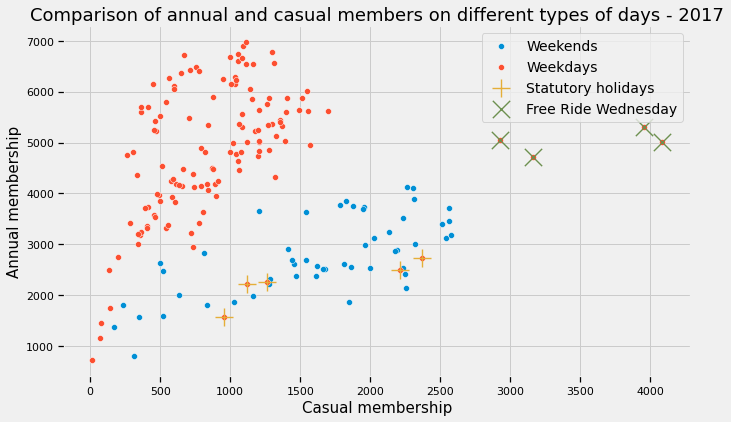

In [ ]:
# Comparing number of rides between annual and casual members in 2017
plotAnnualCasualRelationship(2017)

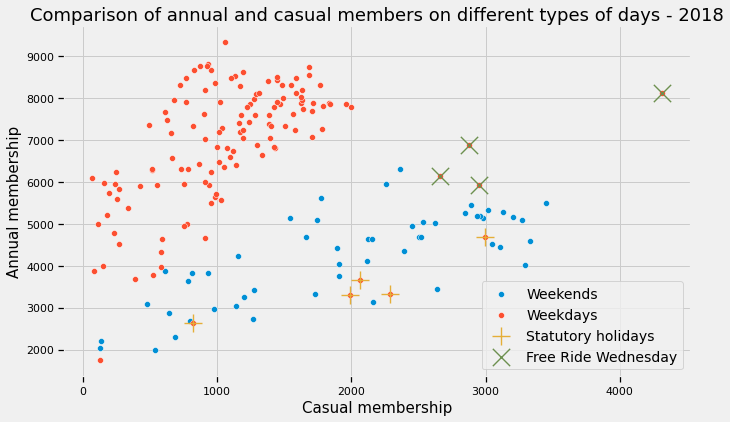

In [ ]:
# Comparing number of rides between annual and casual members in 2018
plotAnnualCasualRelationship(2018)

*The outlier at the lower left corner (red point) is on 2019-09-10.*

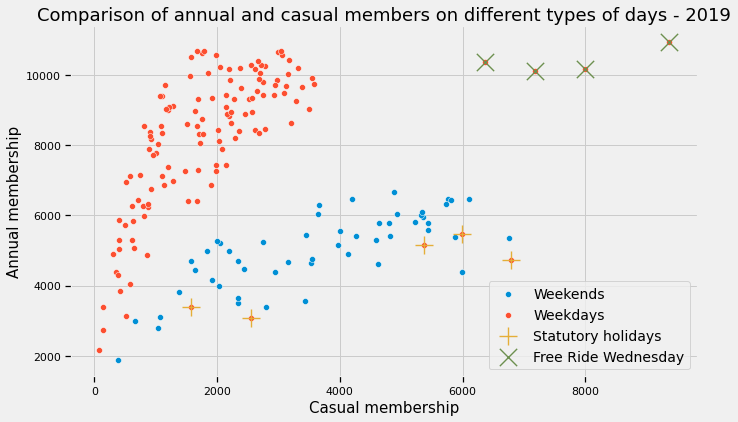

In [ ]:
# Comparing number of rides between annual and casual members in 2019
plotAnnualCasualRelationship(2019)

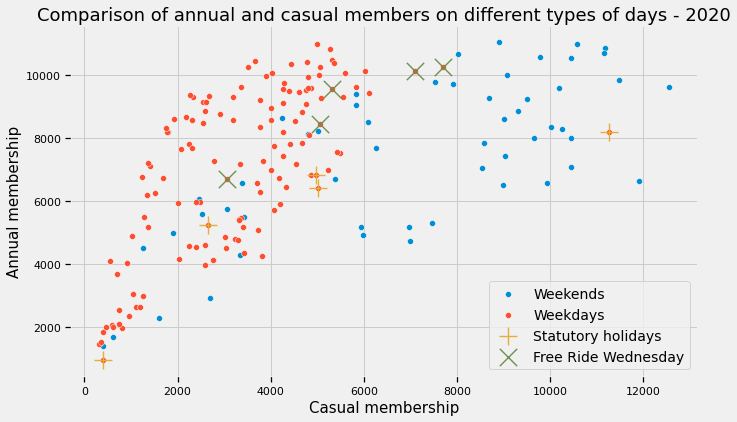

In [ ]:
# Comparing number of rides between annual and casual members in 2019
plotAnnualCasualRelationship(2020)

- Annual members have higher demands of shared bikes compared to that of casual members.
- For 2017-2019, the daily usage data has a clear boundary between workdays and holidays where holidays have less annual member usage and more casual member usage. However, the boundary of the two groups of data is not clear for 2020. That is potentially due to the pandemic lockdown which resulted in the decrease of demand for annual members.
- The bike usage for statutory holidays is similar to that of weekends.
- Free Ride Wednesday gained a great deal of popularity for 2017-2019 but did not see significantly higher demand for 2020.

## 2.2 Analysis of hourly data

### 2.2.1 Generate hourly data

In [ ]:
# Get hourly data
data_hours = data_merged2.groupby(data_merged2.index.hour).agg(rides = ('Trip Id', 'count'),
                                                               annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                               casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual'))))
# Average over number of days
num_days = len(data_days)
data_hours['rides'] = data_hours['rides']/num_days
data_hours['annual_members'] = data_hours['annual_members']/num_days
data_hours['casual_members'] = data_hours['casual_members']/num_days
data_hours.head()

,rides,annual_members,casual_members
Start Time,,,
0,84.022127,58.369736,25.652391
1,47.557459,32.243398,15.314061
2,32.257673,21.511064,10.746610
3,19.286938,12.900071,6.386867
4,10.072805,7.090650,2.982156


### 2.2.2 Plot hourly data

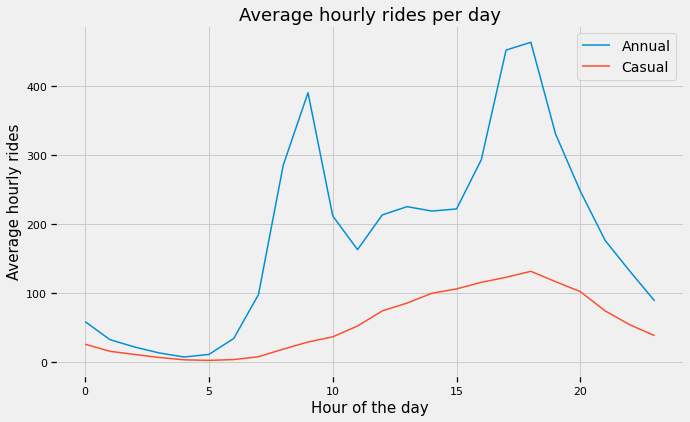

In [ ]:
plt.figure(figsize=(10, 6))
plt.title('Average hourly rides per day', fontsize=18)
sns.lineplot(data_hours.index, data_hours['annual_members'], label = 'Annual')
sns.lineplot(data_hours.index, data_hours['casual_members'], label = 'Casual')
plt.xlabel('Hour of the day', fontsize=15)
plt.ylabel('Average hourly rides', fontsize=15)
plt.legend(fontsize = 14)
plt.show()

- Annual member usage experiences two peaks of the day corresponding to the rush hours at around 9 AM and 5 PM.
- More annual members use shared bikes for off-duty commute than on-duty commute.
- Casual member usage has a single peak at the rush hours in the afternoon. It seems that some casual members prefer to use shared bikes for off-duty commute.

# 3 Analysis of neighbourhoods and bikeshare stations

## 3.1 Import geographic information

### 3.1.1 Neighbourhoods geometry

In [ ]:
# Load neighbourhoods shapefile
neighbourhoods = gpd.read_file('/content/drive/My Drive/CIV1498 Project 2021/toronto_neighbourhoods.shp')

# Extract neighbourhood names and geometries
neighbourhoods = neighbourhoods[['FIELD_8','geometry']].rename(columns={'FIELD_8': 'name'})

# Clean neighbourhood names
neighbourhoods['name']=neighbourhoods.apply(lambda x: x['name'].split("(")[0],axis=1)

# Transform crs to EPSG:26917
neighbourhoods = neighbourhoods.to_crs(epsg=26917)

neighbourhoods.head()

,name,geometry
0,Wychwood,"POLYGON ((626071.503 4837537.756, 626151.708 4..."
1,Yonge-Eglinton,"POLYGON ((628032.302 4840233.689, 628139.346 4..."
2,Yonge-St.Clair,"POLYGON ((629674.232 4837709.743, 629657.497 4..."
3,York University Heights,"POLYGON ((620320.085 4846288.688, 620352.534 4..."
4,Yorkdale-Glen Park,"POLYGON ((625714.291 4840359.316, 625680.263 4..."


### 3.1.2 Bikeshare station geometry

In [ ]:
# Load bikeshare station
bikeshare_stations = pd.read_csv('/content/drive/My Drive/CIV1498 Project 2021/bikeshare_stations.csv')

# Creat a GeoDataFrame from bikeshare_stations
bikeshare_stations_gdf = gpd.GeoDataFrame(bikeshare_stations)
bikeshare_stations_gdf['geometry'] = gpd.points_from_xy(bikeshare_stations_gdf['lon'], bikeshare_stations_gdf['lat'])

# Assign coordinate reference system (crs)
bikeshare_stations_gdf.crs = {'init': 'epsg:4326'}

# Transform crs to EPSG:26917
bikeshare_stations_gdf = bikeshare_stations_gdf.to_crs(epsg=26917)

bikeshare_stations_gdf.head()

,Station Id,Station Name,lat,lon,capacity,geometry
0,7000,Fort York Blvd / Capreol Ct,43.639832,-79.395954,35,POINT (629379.194 4833121.050)
1,7001,Lower Jarvis St / The Esplanade,43.647830,-79.370698,15,POINT (631398.881 4834049.011)
2,7002,St. George St / Bloor St W,43.667333,-79.399429,19,POINT (629039.989 4836169.986)
3,7003,Madison Ave / Bloor St W,43.667158,-79.402761,15,POINT (628771.730 4836145.373)
4,7004,University Ave / Elm St,43.656518,-79.389099,11,POINT (629896.139 4834984.957)


## 3.2 Generate count of rides for neighbourhoods and stations
This subsection will count the total rides for each bikeshare station. Rides that start or end with a station are considered separately. For each neighbourhoods, the summation of rides among stations within the neighbourhood's boundary are also generated.

### 3.2.1 Rides for stations

In [ ]:
# Count start rides for each station
station_rides_start = data_merged.groupby(data_merged['Start Station Id']).agg(rides_start = ('Trip Id', 'count'))

# Count start rides for each station
station_rides_end = data_merged.groupby(data_merged['End Station Id']).agg(rides_end = ('Trip Id', 'count'))

# Concatenate start/end rides 
station_rides = pd.concat([station_rides_start, station_rides_end], axis=1)
station_rides.index.names = ['Station Id']
station_rides.index = station_rides.index.astype(int)

# Merge start/end rides to bikeshare_stations_gdf
bikeshare_stations_gdf = bikeshare_stations_gdf.merge(station_rides, left_on='Station Id', right_on='Station Id', how='left').fillna(0)
bikeshare_stations_gdf['rides_start'] = bikeshare_stations_gdf['rides_start'].astype(int)
bikeshare_stations_gdf['rides_end'] = bikeshare_stations_gdf['rides_end'].astype(int)

bikeshare_stations_gdf.head()

,Station Id,Station Name,lat,lon,capacity,geometry,rides_start,rides_end
0,7000,Fort York Blvd / Capreol Ct,43.639832,-79.395954,35,POINT (629379.194 4833121.050),54040,50623
1,7001,Lower Jarvis St / The Esplanade,43.647830,-79.370698,15,POINT (631398.881 4834049.011),28449,34316
2,7002,St. George St / Bloor St W,43.667333,-79.399429,19,POINT (629039.989 4836169.986),42251,38180
3,7003,Madison Ave / Bloor St W,43.667158,-79.402761,15,POINT (628771.730 4836145.373),26481,22842
4,7004,University Ave / Elm St,43.656518,-79.389099,11,POINT (629896.139 4834984.957),23407,22700


In [ ]:
# Quick sanity check of number of rides
print('Total rides from data_merged: {}'.format(len(data_merged)))
print('Total start rides from bikeshare_stations_gdf: {}'.format(bikeshare_stations_gdf['rides_start'].sum()))
print('Total end rides from bikeshare_stations_gdf: {}'.format(bikeshare_stations_gdf['rides_end'].sum()))

Total rides from data_merged: 8007533
Total start rides from bikeshare_stations_gdf: 8007533
Total end rides from bikeshare_stations_gdf: 8007533


Now present top departing and arriving stations with the largest number of rides.

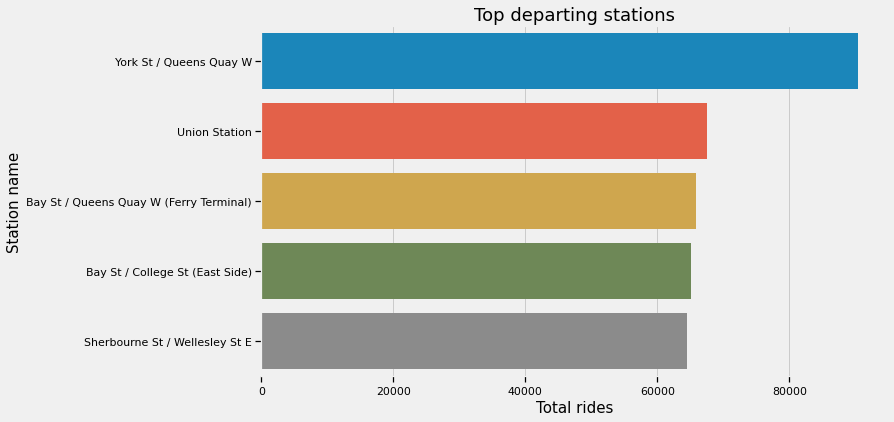

In [ ]:
# Top departing stations
top_start_station = bikeshare_stations_gdf.sort_values(by='rides_start', ascending=False).head()
plt.figure(figsize=(10, 6))
sns.barplot(data=top_start_station, x='rides_start', y='Station Name')
plt.ylabel('Station name', fontsize=15)
plt.xlabel('Total rides', fontsize=15)
plt.title('Top departing stations', fontsize=18);

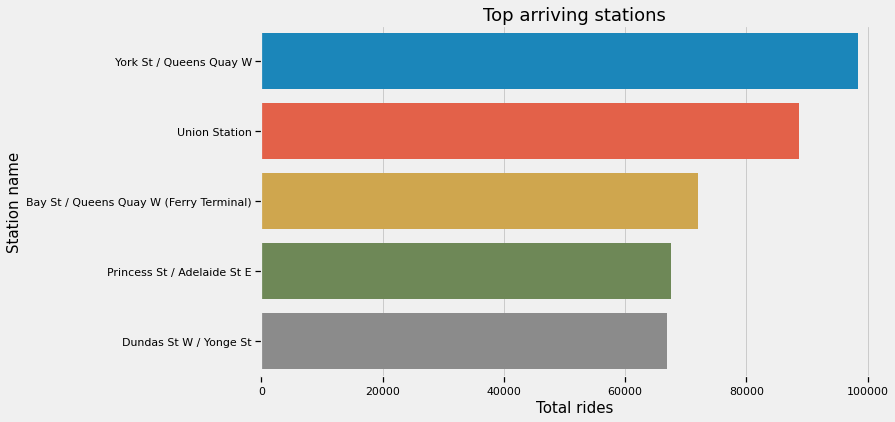

In [ ]:
# Top arriving stations
top_end_station = bikeshare_stations_gdf.sort_values(by='rides_end', ascending=False).head()
plt.figure(figsize=(10, 6))
sns.barplot(data=top_end_station, x='rides_end', y='Station Name')
plt.ylabel('Station name', fontsize=15)
plt.xlabel('Total rides', fontsize=15)
plt.title('Top arriving stations', fontsize=18);

### 3.2.2 Rides for neighbourhoods

In [ ]:
# Add neighbourhood area (km^2)
neighbourhoods['area (km^2)'] = neighbourhoods.geometry.area/10**6

# Add number of bikeshare stations within each neighbourhood
neighbourhoods['stations'] = neighbourhoods.apply(lambda row: sum(bikeshare_stations_gdf.within(row['geometry'])), axis=1)

# Add number of stations per km^2
neighbourhoods['station_density'] = neighbourhoods['stations']/neighbourhoods['area (km^2)']

# Add number of start/end rides within each neighbourhood
neighbourhoods['rides_start'] = neighbourhoods.apply(lambda row: sum(bikeshare_stations_gdf['rides_start'][bikeshare_stations_gdf.within(row['geometry'])]), axis=1)
neighbourhoods['rides_end'] = neighbourhoods.apply(lambda row: sum(bikeshare_stations_gdf['rides_end'][bikeshare_stations_gdf.within(row['geometry'])]), axis=1)

# Sort by number of stations
neighbourhoods = neighbourhoods.sort_values(by='rides_start', ascending=False)

neighbourhoods.head()

,name,geometry,area (km^2),stations,station_density,rides_start,rides_end
61,Waterfront Communities-The Island,"POLYGON ((630894.760 4833934.115, 630991.159 4...",13.416227,60,4.472196,1637380,1746430
80,Bay Street Corridor,"POLYGON ((630036.375 4834338.263, 630107.574 4...",1.809273,47,25.977279,1220422,1250489
97,Church-Yonge Corridor,"POLYGON ((630881.766 4835659.785, 630893.584 4...",1.364556,32,23.450846,673341,629931
136,Kensington-Chinatown,"POLYGON ((628713.653 4833925.535, 628698.164 4...",1.534607,26,16.942443,634314,645821
26,Niagara,"POLYGON ((626833.621 4831957.033, 626830.404 4...",3.241261,31,9.564178,627706,645465


In [ ]:
# Quick sanity check of number of rides
print('Total rides from data_merged: {}'.format(len(data_merged)))
print('Total start rides from bikeshare_stations_gdf: {}'.format(neighbourhoods['rides_start'].sum()))
print('Total end rides from bikeshare_stations_gdf: {}'.format(neighbourhoods['rides_end'].sum()))

Total rides from data_merged: 8007533
Total start rides from bikeshare_stations_gdf: 8007533
Total end rides from bikeshare_stations_gdf: 8007533


Now present top departing and arriving neighbourhoods with the largest number of rides.

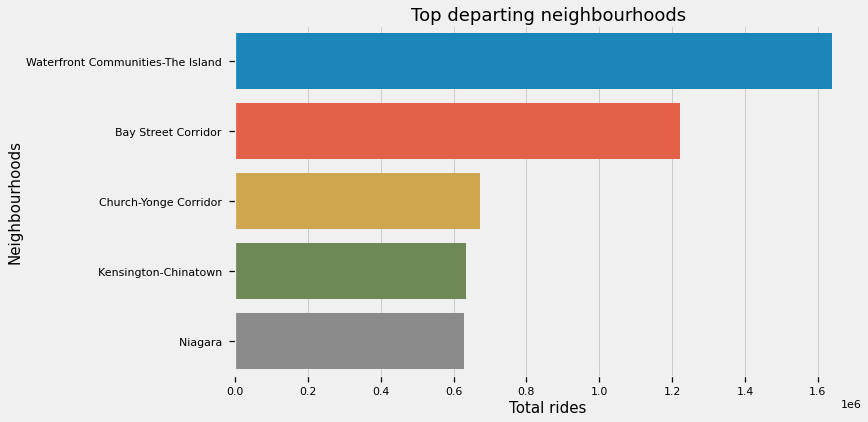

In [ ]:
# Top departing neighbourhoods
top_start_neighbourhoods = neighbourhoods.sort_values(by='rides_start', ascending=False).head()
plt.figure(figsize=(10, 6))
sns.barplot(data=top_start_neighbourhoods, x='rides_start', y='name')
plt.ylabel('Neighbourhoods', fontsize=15)
plt.xlabel('Total rides', fontsize=15)
plt.title('Top departing neighbourhoods', fontsize=18);

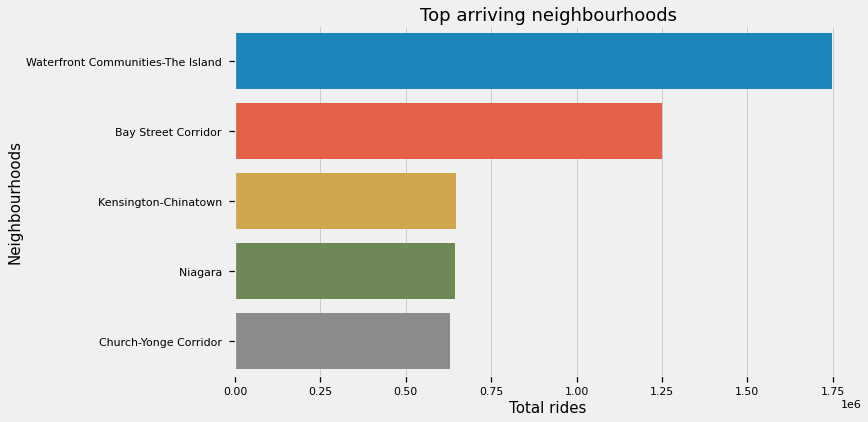

In [ ]:
# Top arriving neighbourhoods
top_end_neighbourhoods = neighbourhoods.sort_values(by='rides_end', ascending=False).head()
plt.figure(figsize=(10, 6))
sns.barplot(data=top_end_neighbourhoods, x='rides_end', y='name')
plt.ylabel('Neighbourhoods', fontsize=15)
plt.xlabel('Total rides', fontsize=15)
plt.title('Top arriving neighbourhoods', fontsize=18);

## 3.3 Results on interactive maps

The first map shows the neighbourhoods boundary and the locations of bike stations.

In [ ]:
# Create a base map
map_1 = folium.Map(location=[43.7000, -79.3871], tiles='cartodbpositron', zoom_start=11.4)

# Add polygons for neighbourhoods
folium.GeoJson(data=neighbourhoods['geometry']).add_to(map_1)

# Add points for bike station
for idx, row in bikeshare_stations_gdf.to_crs(epsg=4326).iterrows():
    folium.Circle(location=[row.geometry.y, row.geometry.x],
           radius=100,
          color='darkorange', ).add_to(map_1)

map_1

The second map is a choropleth map of station density for each neighbourhood

In [ ]:
# Generate a GeoDataFrame for neighbourhood geometry
plot_geography = neighbourhoods.to_crs(epsg=4326)[['name', 'geometry']]
plot_geography = plot_geography.set_index('name')
plot_geography.head()

,geometry
name,
Waterfront Communities-The Island,"POLYGON ((-79.37697 43.64688, -79.37576 43.647..."
Bay Street Corridor,"POLYGON ((-79.38752 43.65067, -79.38663 43.650..."
Church-Yonge Corridor,"POLYGON ((-79.37672 43.66242, -79.37658 43.662..."
Kensington-Chinatown,"POLYGON ((-79.40401 43.64719, -79.40419 43.647..."
Niagara,"POLYGON ((-79.42778 43.62979, -79.42781 43.629..."


In [ ]:
# Generate a DataFrame for neighbourhood station density
plot_data_1 = neighbourhoods[['name', 'station_density']]
plot_data_1 = plot_data_1[plot_data_1['station_density'] > 0]
plot_data_1['station_density'] = np.log(plot_data_1['station_density'])
plot_data_1.head()

,name,station_density
61,Waterfront Communities-The Island,1.497880
80,Bay Street Corridor,3.257222
97,Church-Yonge Corridor,3.154907
136,Kensington-Chinatown,2.829822
26,Niagara,2.258025


In [ ]:
# Create a base map
map_2 = folium.Map(location=[43.7000, -79.3871], tiles='cartodbpositron', zoom_start=11.4)

# Add a choropleth map to the base map
folium.Choropleth(geo_data=plot_geography.__geo_interface__, 
           columns=['name', 'station_density'],
           data=plot_data_1, 
           key_on='feature.id', 
           fill_color='YlOrRd', 
           legend_name='Bikeshare station density (stations / km**2), log scale'
          ).add_to(map_2)

map_2

The third map is a choropleth map of departing rides for each neighbourhood

In [ ]:
# Generate a DataFrame for neighbourhood start rides
plot_data_2 = neighbourhoods[['name', 'rides_start']]
plot_data_2 = plot_data_2[plot_data_2['rides_start']>0]
plot_data_2['rides_start'] = np.log(plot_data_2['rides_start'])
plot_data_2.head()

,name,rides_start
61,Waterfront Communities-The Island,14.308608
80,Bay Street Corridor,14.014707
97,Church-Yonge Corridor,13.420007
136,Kensington-Chinatown,13.360299
26,Niagara,13.349827


In [ ]:
# Create a base map
map_3 = folium.Map(location=[43.7000, -79.3871], tiles='cartodbpositron', zoom_start=11.4)

# Add a choropleth map to the base map
folium.Choropleth(geo_data=plot_geography.__geo_interface__, 
           columns=['name', 'rides_start'],
           data=plot_data_2, 
           key_on='feature.id', 
           fill_color='YlOrRd', 
           legend_name='Departing rides, log scale'
          ).add_to(map_3)

map_3

The fourth map is a choropleth map of arriving rides for each neighbourhood

In [ ]:
# Generate a DataFrame for neighbourhood start rides
plot_data_3 = neighbourhoods[['name', 'rides_end']]
plot_data_3 = plot_data_3[plot_data_3['rides_end']>0]
plot_data_3['rides_end'] = np.log(plot_data_3['rides_end'])
plot_data_3.head()

,name,rides_end
61,Waterfront Communities-The Island,14.373084
80,Bay Street Corridor,14.039045
97,Church-Yonge Corridor,13.353366
136,Kensington-Chinatown,13.378278
26,Niagara,13.377726


In [ ]:
# Create a base map
map_4 = folium.Map(location=[43.7000, -79.3871], tiles='cartodbpositron', zoom_start=11.4)

# Add a choropleth map to the base map
folium.Choropleth(geo_data=plot_geography.__geo_interface__, 
           columns=['name', 'rides_end'],
           data=plot_data_3, 
           key_on='feature.id', 
           fill_color='YlOrRd', 
           legend_name='Arriving rides, log scale'
          ).add_to(map_4)

map_4

- The downtown area has the highest bikeshare station density and also usage demand in Toronto.
- The geographic patterns are similar for departing rides and arriving rides.

# 4 Patterns in trip duration

## 4.1 Distribution of trip duration for annual and casual members

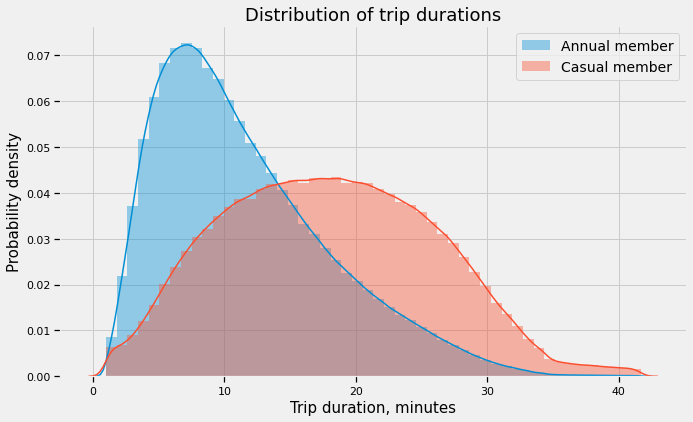

In [ ]:
# Distribution plot of trip duration
plt.figure(figsize=(10, 6))
sns.distplot(data_merged['Trip Duration'][(data_merged['User Type'] == 'Member') | (data_merged['User Type'] == 'Annual Member')]/60, label = 'Annual member')
sns.distplot(data_merged['Trip Duration'][(data_merged['User Type'] == 'Casual') | (data_merged['User Type'] == 'Casual Member')]/60, label = 'Casual member')
plt.ylabel('Probability density', fontsize=15)
plt.xlabel('Trip duration, minutes', fontsize=15)
plt.title('Distribution of trip durations', fontsize=18)
plt.legend(fontsize = 14);

Casual members tend to ride longer in each trip compared to annual members. That is because people who use shared bike for daily commute prefer to have a annual membership and trips for daily commuting are generally shorter.

## 4.2 Duration for each weekday

### 4.2.1 Prepare duration data

In [ ]:
# Generate duration data with weekdays
data_duration = data_merged[['Trip Duration']]/60
data_duration['Start Station Id'] = data_merged['Start Station Id'].astype(int)
data_duration['Weekday'] = data_merged2.index.weekday

data_duration.head()

,Trip Duration,Start Station Id,Weekday
0,4.566667,7006,6
90955,7.550000,7026,6
969587,10.750000,7076,6
1453301,8.233333,7163,6
1453302,7.083333,7163,6


### 4.2.2 Duration for each day of the week

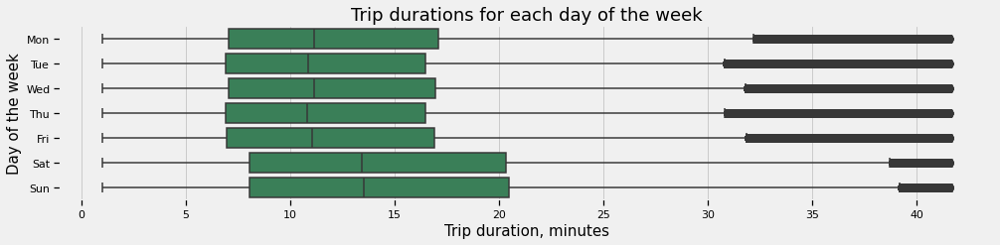

In [ ]:
plt.figure(figsize=(15, 3))
ax = sns.boxplot(y='Weekday', x='Trip Duration', data=data_duration,color="seagreen",orient='h')
y_ticks_labels = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
ax.set_yticklabels(y_ticks_labels)
plt.xlabel('Trip duration, minutes', fontsize=15)
plt.ylabel('Day of the week', fontsize=15)
plt.title('Trip durations for each day of the week', fontsize=18);

- In the boxplot above, the maximum data of each weekday are at the same level because the outliers were dropped in the previous data cleaning step. 
- Trip duration is longer for weekends because of more casual rides for exploring the city.

## 4.3 Mean duration for each month

### 4.3.1 Prepare duration data

In [ ]:
# Mean duration for annual and casual members for each month
duration_mean_months_casual = data_merged2[(data_merged2['User Type'] == 'Casual') | (data_merged2['User Type'] == 'Casual Member')].groupby(pd.Grouper(freq='M')).agg(duration_mean_annual = ('Trip Duration', 'mean'))
duration_mean_months_annual = data_merged2[(data_merged2['User Type'] == 'Member') | (data_merged2['User Type'] == 'Annual Member')].groupby(pd.Grouper(freq='M')).agg(duration_mean_annual = ('Trip Duration', 'mean'))

# Delete the data for November 2020
duration_mean_months_casual = duration_mean_months_casual.iloc[0:-1]
duration_mean_months_annual = duration_mean_months_annual.iloc[0:-1]

duration_mean_months_casual.head()

,duration_mean_annual
Start Time,
2017-01-31 00:00:00-05:00,897.303398
2017-02-28 00:00:00-05:00,986.359981
2017-03-31 00:00:00-05:00,923.789062
2017-04-30 00:00:00-05:00,1020.694951
2017-05-31 00:00:00-05:00,995.901663


### 4.3.2 Plot trend of mean duration

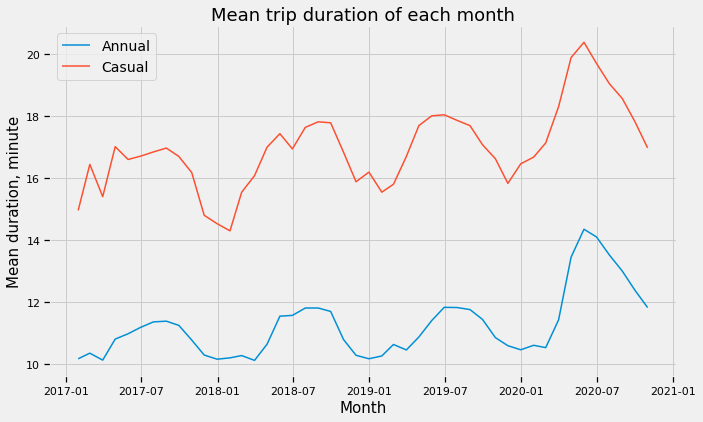

In [ ]:
plt.figure(figsize=(10, 6))
plt.title('Mean trip duration of each month', fontsize=18)
sns.lineplot(duration_mean_months_annual.index, duration_mean_months_annual['duration_mean_annual']/60, label='Annual')
sns.lineplot(duration_mean_months_casual.index, duration_mean_months_casual['duration_mean_annual']/60, label='Casual')
plt.xlabel('Month', fontsize=15)
plt.ylabel('Mean duration, minute', fontsize=15)
plt.legend(fontsize = 14)
plt.show()

- A seasonal trend can be seen from the mean trip duration plot shown above. People tend to ride longer during summer and autumn.
- Trip duration has a slight increase trend between 2017 and 2019 and sees a larger increase in 2020 where the mean trip duration for June increased by 2 minutes compared to that of 2019.
- Casual members tend to ride longer than annual members.

## 4.4 Geographic pattern in duration

### 4.4.1 Generate mean duration for each neighbourhood

In [ ]:
# Duration sum for start station
station_duration_start = data_merged.groupby(data_merged['Start Station Id']).agg(duration_sum_start = ('Trip Duration', 'sum'))

# Duration sum for end station
station_duration_end = data_merged.groupby(data_merged['End Station Id']).agg(duration_sum_end = ('Trip Duration', 'sum'))

# Concatenate start/end duration 
station_duration = pd.concat([station_duration_start, station_duration_end], axis=1)
station_duration.index.names = ['Station Id']
station_duration.index = station_rides.index.astype(int)

# Merge to bikeshare_stations_gdf
bikeshare_stations_gdf = bikeshare_stations_gdf.merge(station_duration, left_on='Station Id', right_on='Station Id', how='left').fillna(0)

bikeshare_stations_gdf.head()

,Station Id,Station Name,lat,lon,capacity,geometry,rides_start,rides_end,duration_sum_start,duration_sum_end
0,7000,Fort York Blvd / Capreol Ct,43.639832,-79.395954,35,POINT (629379.194 4833121.050),54040,50623,39931278.0,38990223.0
1,7001,Lower Jarvis St / The Esplanade,43.647830,-79.370698,15,POINT (631398.881 4834049.011),28449,34316,21834331.0,26158138.0
2,7002,St. George St / Bloor St W,43.667333,-79.399429,19,POINT (629039.989 4836169.986),42251,38180,26474205.0,24457748.0
3,7003,Madison Ave / Bloor St W,43.667158,-79.402761,15,POINT (628771.730 4836145.373),26481,22842,18284444.0,15924287.0
4,7004,University Ave / Elm St,43.656518,-79.389099,11,POINT (629896.139 4834984.957),23407,22700,14299107.0,13818287.0


In [ ]:
# Add a column of neighbourhoods to bikeshare_stations_gdf
bikeshare_stations_gdf['neighbourhood'] = ' '
for i in range(len(neighbourhoods)):
    bikeshare_stations_gdf['neighbourhood'][bikeshare_stations_gdf.within(neighbourhoods['geometry'].iloc[i])] = neighbourhoods['name'].iloc[i]

bikeshare_stations_gdf.head()

,Station Id,Station Name,lat,lon,capacity,geometry,rides_start,rides_end,duration_sum_start,duration_sum_end,neighbourhood
0,7000,Fort York Blvd / Capreol Ct,43.639832,-79.395954,35,POINT (629379.194 4833121.050),54040,50623,39931278.0,38990223.0,Waterfront Communities-The Island
1,7001,Lower Jarvis St / The Esplanade,43.647830,-79.370698,15,POINT (631398.881 4834049.011),28449,34316,21834331.0,26158138.0,Waterfront Communities-The Island
2,7002,St. George St / Bloor St W,43.667333,-79.399429,19,POINT (629039.989 4836169.986),42251,38180,26474205.0,24457748.0,University
3,7003,Madison Ave / Bloor St W,43.667158,-79.402761,15,POINT (628771.730 4836145.373),26481,22842,18284444.0,15924287.0,Annex
4,7004,University Ave / Elm St,43.656518,-79.389099,11,POINT (629896.139 4834984.957),23407,22700,14299107.0,13818287.0,Kensington-Chinatown


In [ ]:
# Generate mean duration for each neighbourhood
duration_neighbourhood = bikeshare_stations_gdf.groupby('neighbourhood').agg(duration_sum = ('duration_sum_start', 'sum'), rides_sum = ('rides_start', 'sum'))
duration_neighbourhood['duration_mean'] = duration_neighbourhood['duration_sum']/duration_neighbourhood['rides_sum']

# Merge mean duration to neighbourhoods
duration_neighbourhood = duration_neighbourhood.reset_index().drop(['duration_sum', 'rides_sum'], axis=1).rename(columns = {'neighbourhood':'name'})
neighbourhoods = neighbourhoods.merge(duration_neighbourhood, left_on='name', right_on='name', how='left').fillna(0)
neighbourhoods.head()

,name,geometry,area (km^2),stations,station_density,rides_start,rides_end,duration_mean
0,Waterfront Communities-The Island,"POLYGON ((630894.760 4833934.115, 630991.159 4...",13.416227,60,4.472196,1637380,1746430,784.854322
1,Bay Street Corridor,"POLYGON ((630036.375 4834338.263, 630107.574 4...",1.809273,47,25.977279,1220422,1250489,679.853410
2,Church-Yonge Corridor,"POLYGON ((630881.766 4835659.785, 630893.584 4...",1.364556,32,23.450846,673341,629931,657.033958
3,Kensington-Chinatown,"POLYGON ((628713.653 4833925.535, 628698.164 4...",1.534607,26,16.942443,634314,645821,677.095842
4,Niagara,"POLYGON ((626833.621 4831957.033, 626830.404 4...",3.241261,31,9.564178,627706,645465,898.153621


### 4.4.2 Choropleth map of mean duration

In [ ]:
# Generate a GeoDataFrame for neighbourhood geometry
plot_geography2 = neighbourhoods.to_crs(epsg=4326)[['name', 'geometry']]
plot_geography2 = plot_geography2.set_index('name')
plot_geography2.head()

,geometry
name,
Waterfront Communities-The Island,"POLYGON ((-79.37697 43.64688, -79.37576 43.647..."
Bay Street Corridor,"POLYGON ((-79.38752 43.65067, -79.38663 43.650..."
Church-Yonge Corridor,"POLYGON ((-79.37672 43.66242, -79.37658 43.662..."
Kensington-Chinatown,"POLYGON ((-79.40401 43.64719, -79.40419 43.647..."
Niagara,"POLYGON ((-79.42778 43.62979, -79.42781 43.629..."


In [ ]:
# Generate a DataFrame for neighbourhood mean trip duration
plot_data_4 = neighbourhoods[['name', 'duration_mean']]
plot_data_4['duration_mean'] = plot_data_4['duration_mean']/60
plot_data_4 = plot_data_4[plot_data_4['duration_mean'] > 0]
plot_data_4.head()

,name,duration_mean
0,Waterfront Communities-The Island,13.080905
1,Bay Street Corridor,11.330890
2,Church-Yonge Corridor,10.950566
3,Kensington-Chinatown,11.284931
4,Niagara,14.969227


In [ ]:
# Create a base map
map_4_1 = folium.Map(location=[43.7000, -79.3871], tiles='cartodbpositron', zoom_start=11.4)

# Add a choropleth map to the base map
folium.Choropleth(geo_data=plot_geography2.__geo_interface__, 
           columns=['name', 'duration_mean'],
           data=plot_data_4, 
           key_on='feature.id', 
           fill_color='YlOrRd', 
           legend_name='Mean trip duration, minute'
          ).add_to(map_4_1)

map_4_1

Trip duration in downtown area is shorter than that of the suburbs. This pattern is reasonable because there are a large amount of short rides for daily commuting in downtown.

# 5 Effects of weather

## 5.1 Generate daily weather data

In [ ]:
# Generate hourly number of rides, average hourly trip duration, and hourly weather data
hourly_rides_and_weather = data_merged2.groupby(data_merged2.index.floor('H')).agg(rides = ('Trip Id', 'count'),
                                                    annual_members = ('User Type', lambda x: sum(x.isin(['Annual Member', 'Member'])) ),
                                                    casual_members = ('User Type', lambda y: sum(y.isin(['Casual Member', 'Casual']))),
                                                    duration = ('Trip Duration', 'mean'),
                                                    temp = ('Temp (°C)', 'mean'),
                                                    dew_temp = ('Dew Point Temp (°C)', 'mean'),
                                                    rel_hum = ('Rel Hum (%)', 'mean'),
                                                    wind_speed = ('Wind Spd (km/h)', 'mean'), 
                                                    visibility = ('Visibility (km)', 'mean'),
                                                    humidex = ('Hmdx', 'mean'),
                                                    wind_chill = ('Wind Chill', 'mean'),
                                                    wind_direction = ('Wind Dir (10s deg)', 'mean'),
                                                    precipitation = ('Weather', lambda p: bool(sum(p.str.contains('rain|snow', case = False)))), # boolean indicating if there is rain or snow                                                                                             
                                                    Weather = ('Weather', lambda w: w.iloc[0]),                              
                                                    )

# Create a new column 'Weather_simple' based on the 'Weather' column stating if the weather is clear or not
weather_cond = data_merged2['Weather'].unique()
hourly_rides_and_weather['Weather_simple'] = hourly_rides_and_weather['Weather'].replace(np.delete(weather_cond, np.where(weather_cond == 'Clear')).tolist(), value = 'Non-clear')

hourly_rides_and_weather.head()


,rides,annual_members,casual_members,duration,temp,dew_temp,rel_hum,wind_speed,visibility,humidex,wind_chill,wind_direction,precipitation,Weather,Weather_simple
Start Time,,,,,,,,,,,,,,,
2017-01-01 00:00:00-05:00,20,18,2,561.900000,1.5,-3.6,69.0,39.0,16.1,NaN,NaN,26.0,False,Clear,Clear
2017-01-01 01:00:00-05:00,15,15,0,715.600000,1.5,-3.9,67.0,35.0,16.1,NaN,NaN,27.0,False,Clear,Clear
2017-01-01 02:00:00-05:00,15,15,0,407.066667,1.0,-4.3,68.0,32.0,16.1,NaN,NaN,26.0,False,Clear,Clear
2017-01-01 03:00:00-05:00,11,9,2,585.727273,1.2,-4.3,67.0,37.0,16.1,NaN,NaN,26.0,False,Clear,Clear
2017-01-01 04:00:00-05:00,7,7,0,583.714286,1.3,-4.4,66.0,28.0,16.1,NaN,NaN,26.0,False,Clear,Clear


In [ ]:
# Generate daily number of rides, average daily trip duration, and daily weather data
daily_rides_and_weather = hourly_rides_and_weather.groupby(hourly_rides_and_weather.index.floor('D')).agg(
                                                    rides = ('rides', 'sum'),
                                                    annual_members = ('annual_members', 'sum' ),
                                                    casual_members = ('casual_members', 'sum'),
                                                    duration = ('duration', 'mean'),                                                  
                                                    temp = ('temp', 'mean'),
                                                    dew_temp = ('dew_temp', 'mean'),
                                                    rel_hum = ('rel_hum', 'mean'),
                                                    wind_speed = ('wind_speed', 'mean'),
                                                    visibility = ('visibility', 'mean'),
                                                    humidex = ('humidex', 'mean'),
                                                    wind_chill = ('wind_chill', 'mean'),
                                                    wind_direction = ('wind_direction', 'mean'),
                                                    precipitation = ('precipitation', lambda p: p.value_counts().sort_index().idxmax()), # boolean indicating if there is rain or snow  
                                                    weather = ('Weather', lambda w: w.value_counts().sort_index().idxmax()),
                                                    weather_simple = ('Weather_simple', lambda z: z.value_counts().sort_index().idxmax()) 

                                                    )        
daily_rides_and_weather.head()

,rides,annual_members,casual_members,duration,temp,dew_temp,rel_hum,wind_speed,visibility,humidex,wind_chill,wind_direction,precipitation,weather,weather_simple
Start Time,,,,,,,,,,,,,,,
2017-01-01 00:00:00-05:00,477,409,68,630.622461,1.400000,-4.445833,65.541667,22.875000,16.100000,NaN,-6.000000,24.291667,False,Clear,Clear
2017-01-02 00:00:00-05:00,799,740,59,600.565188,2.854167,0.175000,82.666667,20.291667,15.566667,NaN,-2.000000,6.645833,False,Clear,Clear
2017-01-03 00:00:00-05:00,862,844,18,635.072530,4.254167,3.766667,96.666667,15.375000,9.662500,NaN,NaN,9.625000,True,"Rain,Fog",Non-clear
2017-01-04 00:00:00-05:00,1378,1344,34,597.316721,-1.390909,-5.900000,72.227273,38.818182,15.881818,NaN,-14.583333,25.954545,False,Clear,Clear
2017-01-05 00:00:00-05:00,1186,1167,19,617.827856,-6.847826,-12.200000,66.086957,35.130435,16.030435,NaN,-15.913043,25.739130,False,Clear,Clear


The values used under each weather feature were determined using the mean. Using maximum, minimum, or mean should only affect the magnitude of the values but not the general trend for most features. An additional column called 'Precipitation' was added because the 'non-clear' condition in the 'Weather_simple' column includes non-precipitating conditions; therefore, the new column will have strictly precipitating conditions to investigate any differences between the two columns.

## 5.2 Plots of daily rides versus weather features

In [ ]:
# Dictionary for labelling key words in axes and title
labels = {'temp':'Temperature (°C)',
          'dew_temp':'Dew Point Temperature (°C)',
          'rel_hum':'Relative Humidity (%)',
          'wind_speed':'Wind Speed (km/h)',
          'visibility':'Visibility (km)',
          'humidex':'Humidex (unitless)',
          'wind_chill':'Wind Chill (unitless)',
          'wind_direction':'Wind Direction (10s of degrees)',
          'annual_members':'Annual Members',
          'casual_members':'Casual Members',
          'rides':'Total',
          'duration':'Average Trip Duration'          
          }

# Create a function for plotting
def ride_weather_plot(x_axis, *y_axis, label = labels):
  """ A function that plots the number of rides with respect to a weather feature """
  y_axis = list(y_axis)
  plt.figure(figsize = (10,6))
  for y in y_axis:
      ax = sns.scatterplot(data = daily_rides_and_weather, x = x_axis, y = y,  s = 20)
      ax.set_title('Effect of ' + labels[x_axis].split('(')[0] + 'on daily rides', fontsize = 18)
      ax.set_xlabel('Mean Daily ' + labels[x_axis], fontsize = 15)
      ax.set_ylabel('Rides per Day', fontsize = 15)

  ax.legend([labels[key] for key in y_axis], fontsize = 14)

### 5.2.1 Weather condition and precipitation

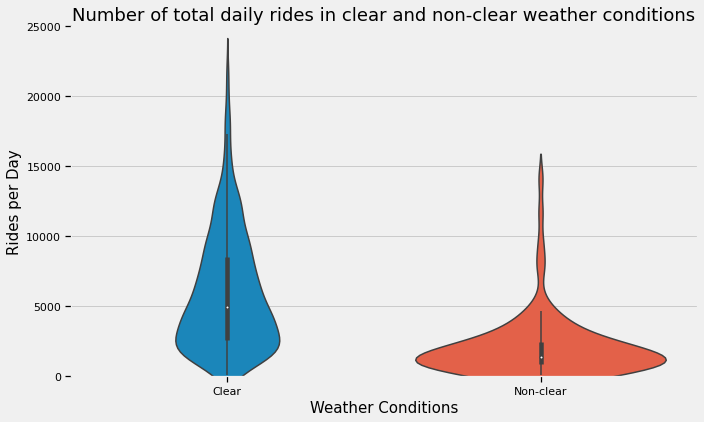

In [ ]:
# Plot of daily rides versus weather
plt.figure(figsize = (10,6))
ax = sns.violinplot(data = daily_rides_and_weather, x = 'weather_simple', y = 'rides', order = ['Clear', 'Non-clear'] )
ax.set_xlabel('Weather Conditions', fontsize = 15)
ax.set_ylabel('Rides per Day', fontsize = 15)
ax.set_ylim(0, 25000)
ax.set_title('Number of total daily rides in clear and non-clear weather conditions', fontsize = 18);

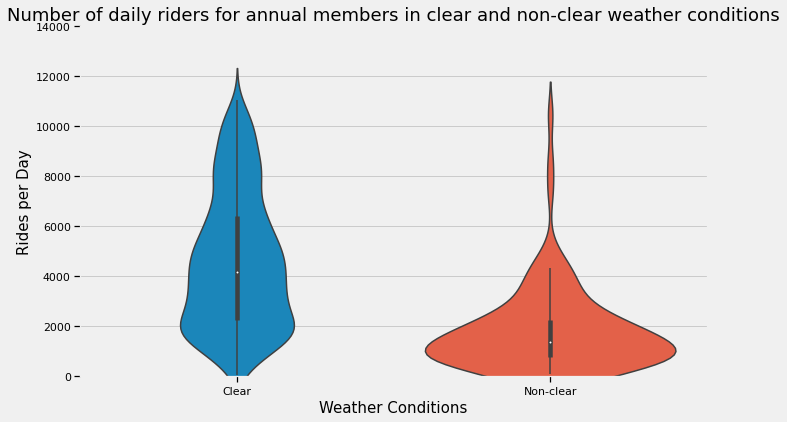

In [ ]:
# Plot of daily rides for annual members versus weather
plt.figure(figsize = (10,6))
ax = sns.violinplot(data = daily_rides_and_weather, x = 'weather_simple', y = 'annual_members', order = ['Clear', 'Non-clear'] )
ax.set_xlabel('Weather Conditions', fontsize = 15)
ax.set_ylabel('Rides per Day', fontsize = 15)
ax.set_ylim(-1, 14000)
ax.set_title('Number of daily riders for annual members in clear and non-clear weather conditions', fontsize = 18);

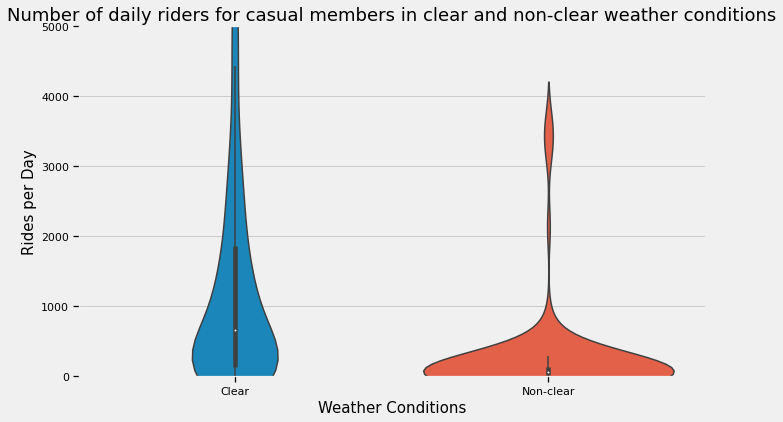

In [ ]:
# Plot of daily rides for casual members versus weather
plt.figure(figsize = (10,6))
ax = sns.violinplot(data = daily_rides_and_weather, x = 'weather_simple', y = 'casual_members', order = ['Clear', 'Non-clear'] )
ax.set_xlabel('Weather Conditions', fontsize = 15)
ax.set_ylabel('Rides per Day', fontsize = 15)
ax.set_ylim(-1, 5000)
ax.set_title('Number of daily riders for casual members in clear and non-clear weather conditions', fontsize = 18);

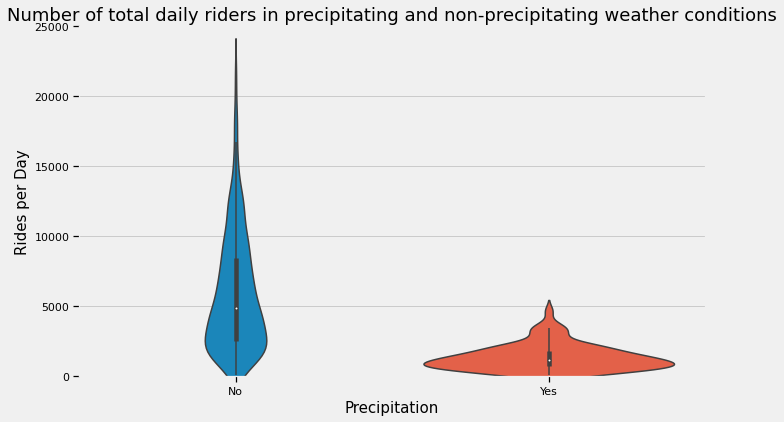

In [ ]:
# Plot of daily rides versus precipitation
plt.figure(figsize = (10,6))
ax = sns.violinplot(data = daily_rides_and_weather, x = 'precipitation', y = 'rides')
ax.set_xticklabels(['No', 'Yes'])
ax.set_xlabel('Precipitation', fontsize = 15)
ax.set_ylabel('Rides per Day', fontsize = 15)
ax.set_ylim(0, 25000)
ax.set_title('Number of total daily riders in precipitating and non-precipitating weather conditions', fontsize = 18);

The figures above show that, in general, more people ride when there are not any forms of precipitation or other weather elements that reduce visibility. However, it does appear that regardless of the weather, there will always be a minimum number of rides each day, which could be interpreted as people that do not care about the weather condition. Additionally, annual members are more likely to continue riding bikes than casual members in subpar weather conditions. Some of the plots exhibit a "stretching" effect toward the higher values. This is caused by the presence of some mild outliers.

### 5.2.2 Temperature

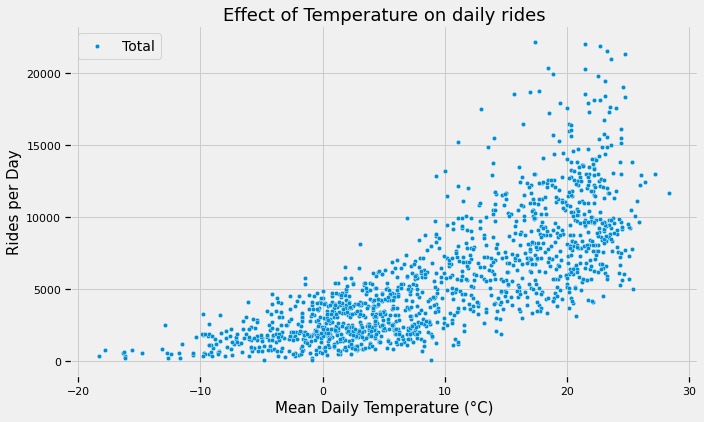

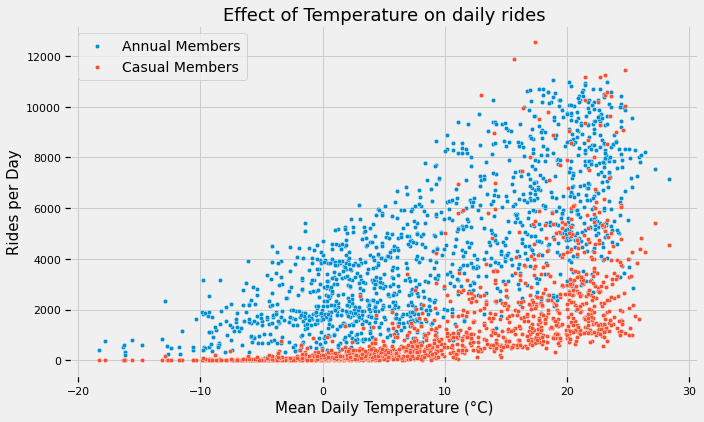

In [ ]:
# Plot of daily rides versus temperature
ride_weather_plot('temp', 'rides')
ride_weather_plot('temp', 'annual_members', 'casual_members')

There is an overall positive trend where the number of rides increases with temperature. This is expected as warmer weather favour outdoor activities especially for the casual members as can be seen in the dramatic increase in ridership compared to the annual members.

### 5.2.3 Dew Temperature

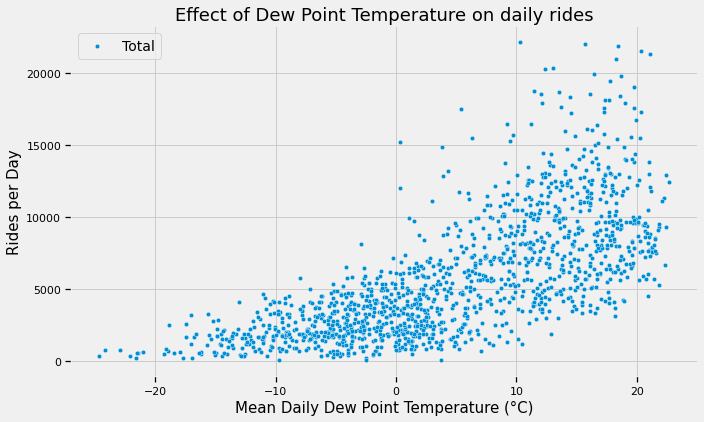

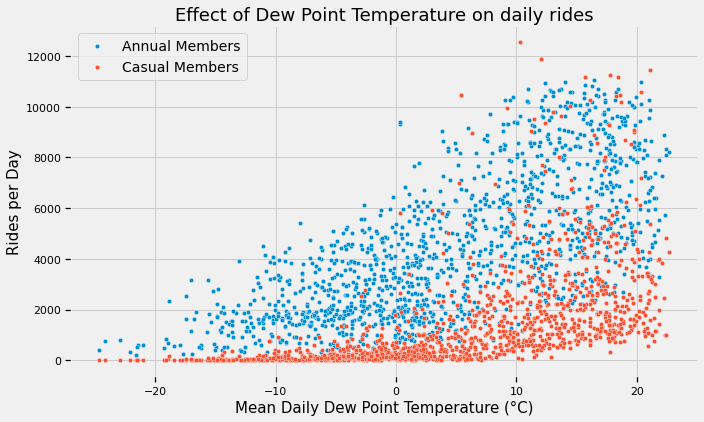

In [ ]:
# Plot of daily rides versus dew temperature
ride_weather_plot('dew_temp', 'rides')
ride_weather_plot('dew_temp', 'annual_members', 'casual_members')

Dew temperature is dependent on air temperature and humidity (https://climate.weather.gc.ca/glossary_e.html#), so the result is near identical to that of the air temperature figures above.

### 5.2.4 Relative Humidity

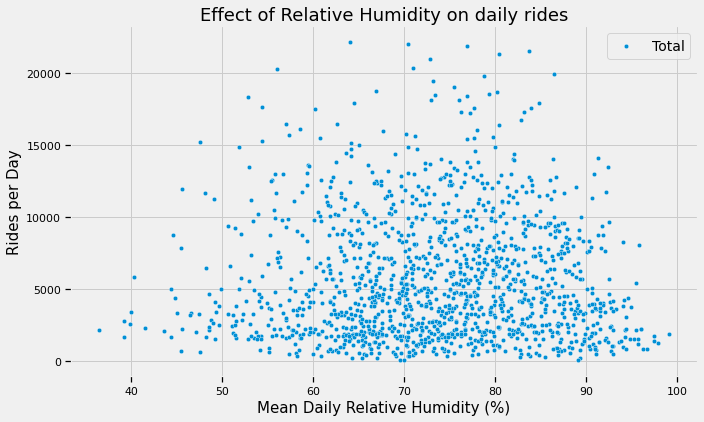

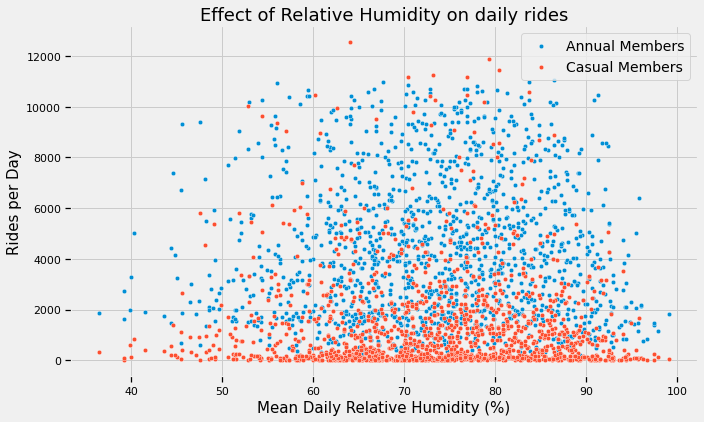

In [ ]:
# Plot of daily rides versus relative humidity
ride_weather_plot('rel_hum', 'rides')
ride_weather_plot('rel_hum', 'annual_members', 'casual_members')

Overall there does not seem to be any appreciable effects. 

### 5.2.5 Wind Speed

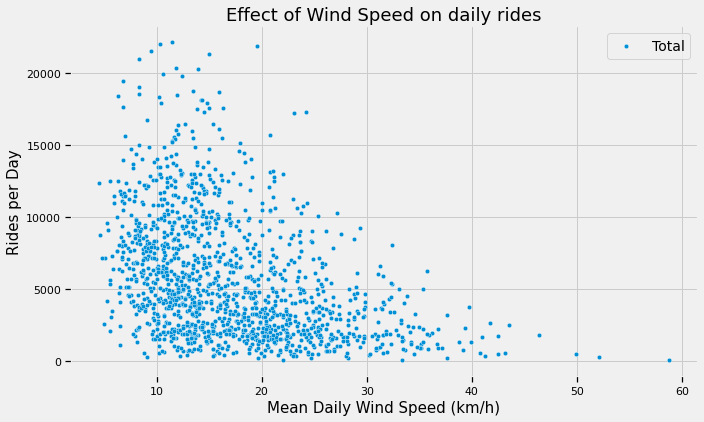

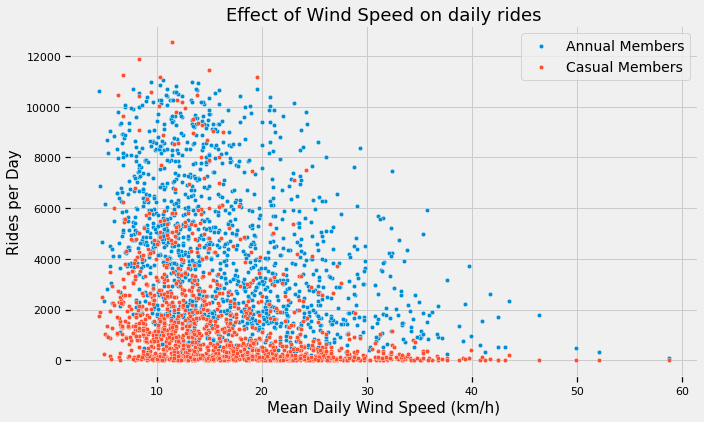

In [ ]:
# Plot of daily rides versus wind speed
ride_weather_plot('wind_speed', 'rides')
ride_weather_plot('wind_speed', 'annual_members', 'casual_members')

As wind speed increases, the number of riders decrease quite noticeably. This can be attributed to the increase difficulty of riding against the wind especially when facing the wind tunnel effect caused by the tall and dense buildings in the downtown area as well as the effect of wind chill in the winter.

### 5.2.6 Visibility

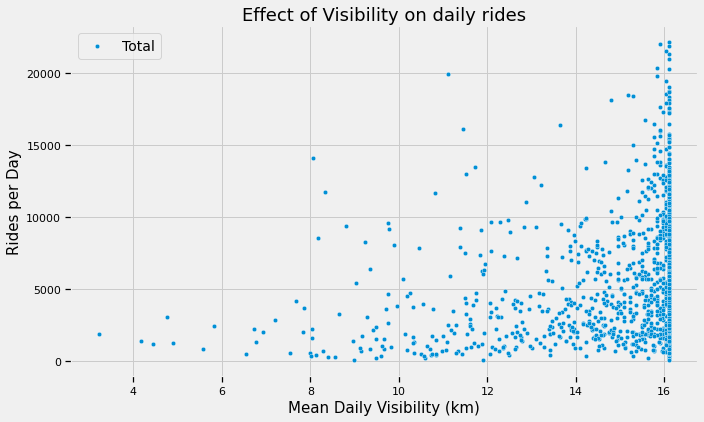

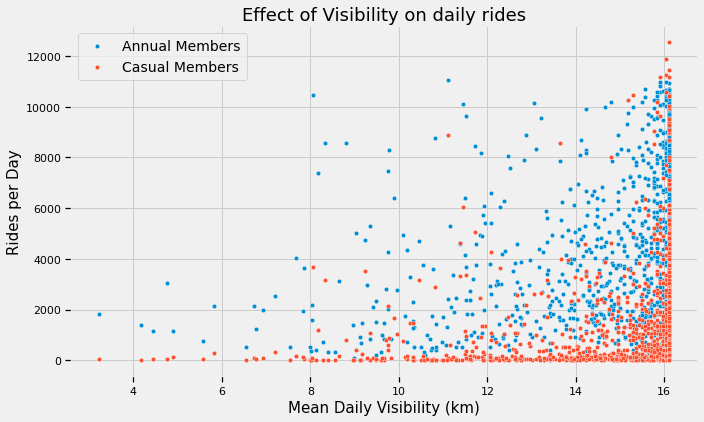

In [ ]:
# Plot of daily rides versus visibility
ride_weather_plot('visibility', 'rides')
ride_weather_plot('visibility', 'annual_members', 'casual_members')

There is some indication that as visibility increases, the number of rides increases. Intuitively, this makes sense as poor visibility is usually attributed to poor weather conditions such as precipitation or fog.

### 5.2.7 Humidex

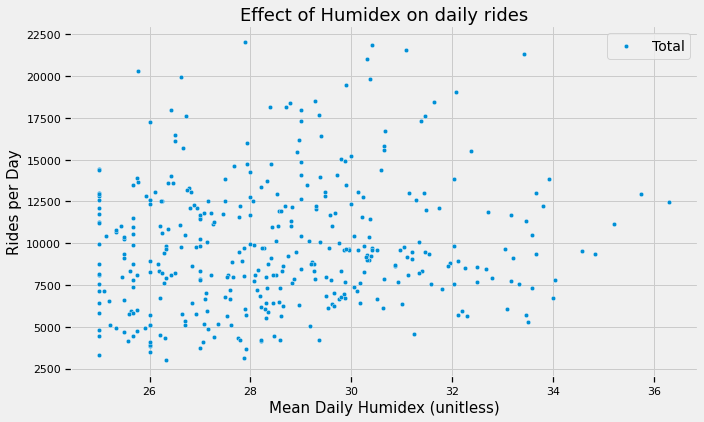

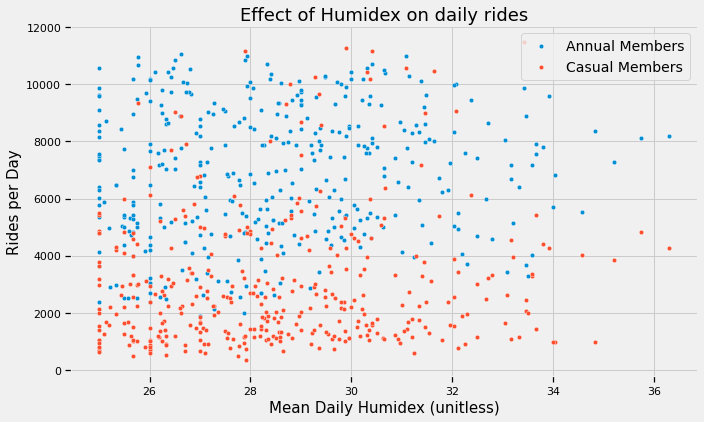

In [ ]:
# Plot of total daily rides versus humidex
ride_weather_plot('humidex', 'rides')
ride_weather_plot('humidex', 'annual_members', 'casual_members')

Interestingly, humidex values do not seem to affect ridership greatly. Perhaps when the weather is sufficiently warm (above 20 degrees celsius air temperature), the number of riders do not change appreciably. This phenomenon can be seen in the temperature graph above 20 degrees celsius.

### 5.2.8 Wind Chill

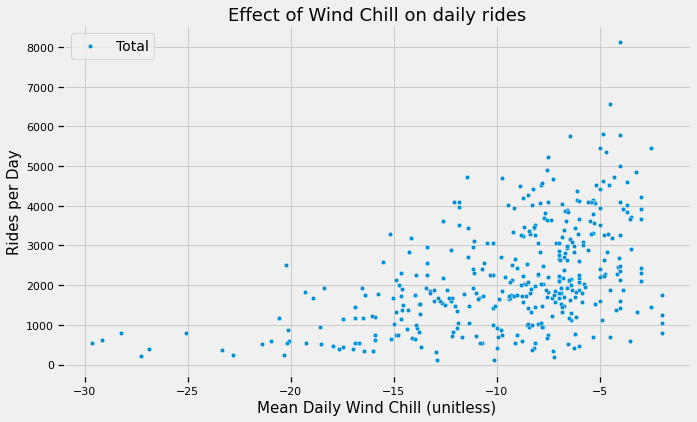

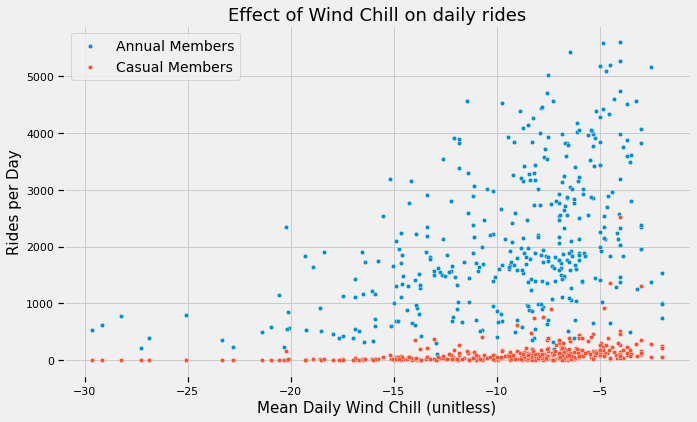

In [ ]:
# Plot of daily rides versus wind chill
ride_weather_plot('wind_chill', 'rides')
ride_weather_plot('wind_chill', 'annual_members', 'casual_members')

The increase in rides with increasing wind chill makes sense since a lower wind chill corresponds to colder weather. The change in casual members appear to be minimal but given the general low number of casual riders in the winter months, any change is quite distinguishable. For example, it is clear that below around -12 wind chill there are almost no casual riders compared to when the wind chill is closer to zero.

### 5.2.9 Wind Direction

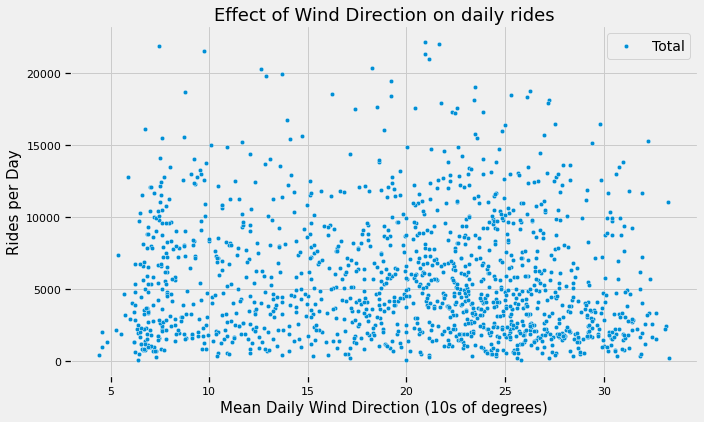

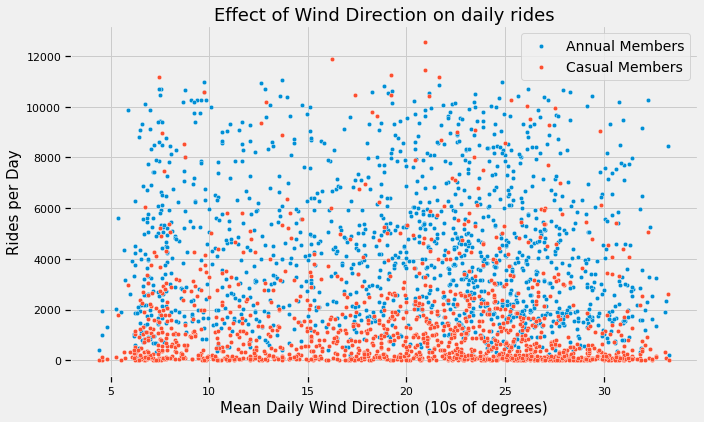

In [ ]:
# Plot of daily rides versus wind direction
ride_weather_plot('wind_direction', 'rides')
ride_weather_plot('wind_direction', 'annual_members', 'casual_members')

The plot shows that there is no effect on ridership caused by wind direction. In reality, the wind direction observed at the weather station could be significantly different than the conditions experienced in the city due to change in location and elevation, wind tunnels, etc.

## 5.3 Plots of daily average trip duration versus weather features

In [ ]:
# Create a function for plotting
def duration_weather_plot(x_axis, *y_axis, label = labels):
  """Plot trip duration against a weather feature"""
  y_axis = list(y_axis)
  plt.figure(figsize = (10,6))
  
  for y in y_axis:
      ax = sns.scatterplot(data = daily_rides_and_weather, x = x_axis, y = y,  s = 20)
      ax.set_title('Effect of ' + labels[x_axis].split('(')[0] + 'on average trip duration', fontsize = 18)
      ax.set_xlabel('Mean Daily ' + labels[x_axis], fontsize = 15)
      ax.set_ylabel('Average Duration per Day (s)', fontsize = 15)

  ax.legend([labels[key] for key in y_axis], fontsize = 14)

### 5.3.1 Weather condition and precipitation

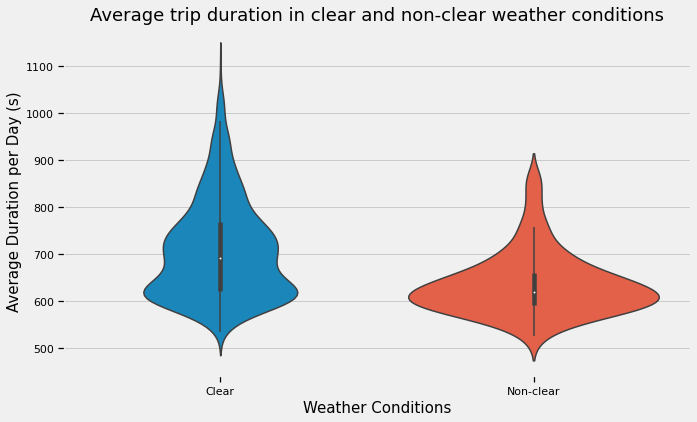

In [ ]:
# Plot of daily average trip duration versus weather
plt.figure(figsize = (10,6))
ax = sns.violinplot(data = daily_rides_and_weather, x = 'weather_simple', y = 'duration', order = ['Clear', 'Non-clear'] )
ax.set_xlabel('Weather Conditions', fontsize = 15)
ax.set_ylabel('Average Duration per Day (s)', fontsize = 15)
ax.set_title('Average trip duration in clear and non-clear weather conditions', fontsize = 18);

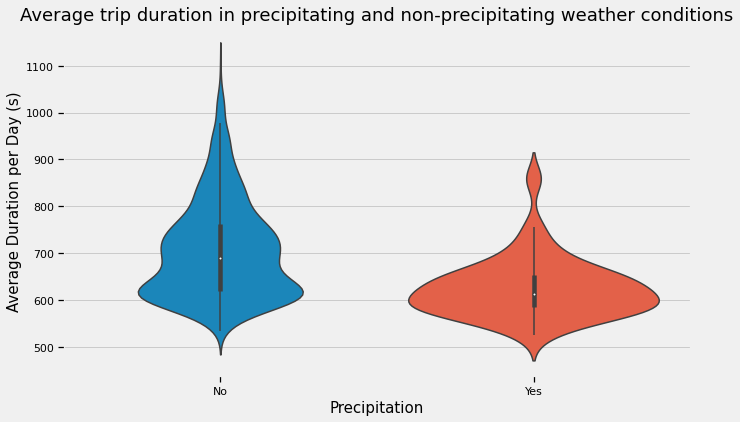

In [ ]:
# Plot of daily average trip duration versus precipitation
plt.figure(figsize = (10,6))
ax = sns.violinplot(data = daily_rides_and_weather, x = 'precipitation', y = 'duration')
ax.set_xticklabels(['No', 'Yes'])
ax.set_xlabel('Precipitation', fontsize = 15)
ax.set_ylabel('Average Duration per Day (s)', fontsize = 15)
ax.set_title('Average trip duration in precipitating and non-precipitating weather conditions', fontsize = 18);

The average trip duration also decreases with different weather conditions, but the change is more subtle compared to the number of rides. This could be due to the fact that those people who ride are already committed to the trip, meaning the trip will not likely be cut short due to weather. 

### 5.3.2 Temperature

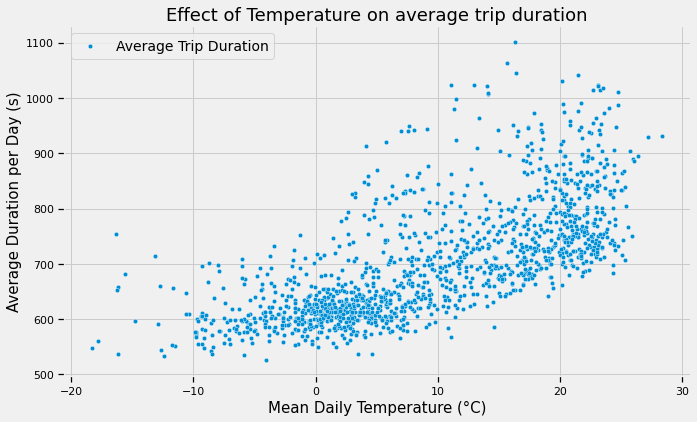

In [ ]:
# Plot of daily average trip duration versus temperature
duration_weather_plot('temp', 'duration')

### 5.3.3 Dew Temperature

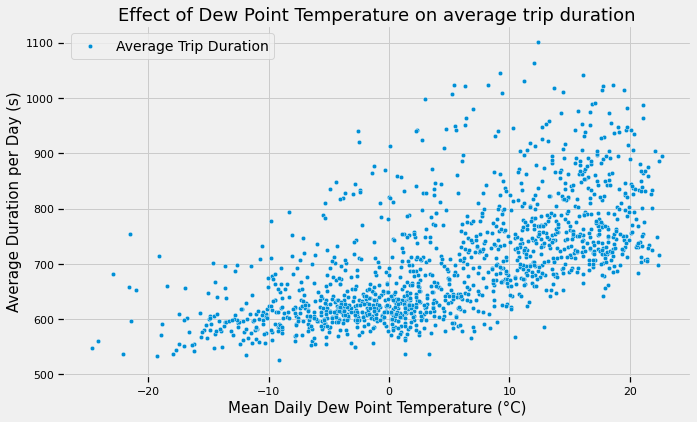

In [ ]:
# Plot of daily average trip duration versus dew temperature
duration_weather_plot('dew_temp', 'duration')

### 5.3.4 Relative Humidity

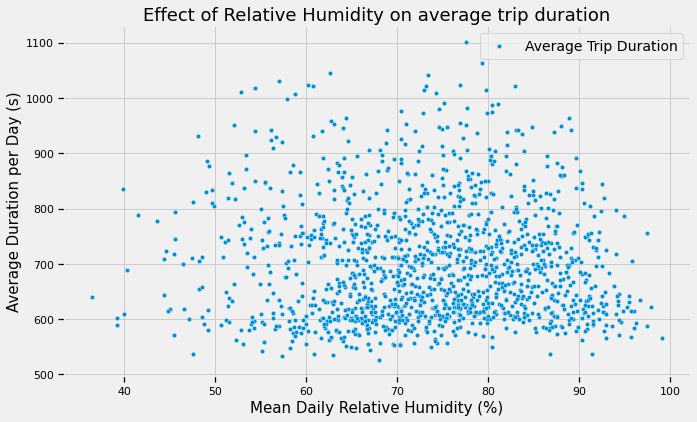

In [ ]:
# Plot of daily average trip duration versus relative humidity
duration_weather_plot('rel_hum', 'duration')

### 5.3.5 Wind Speed

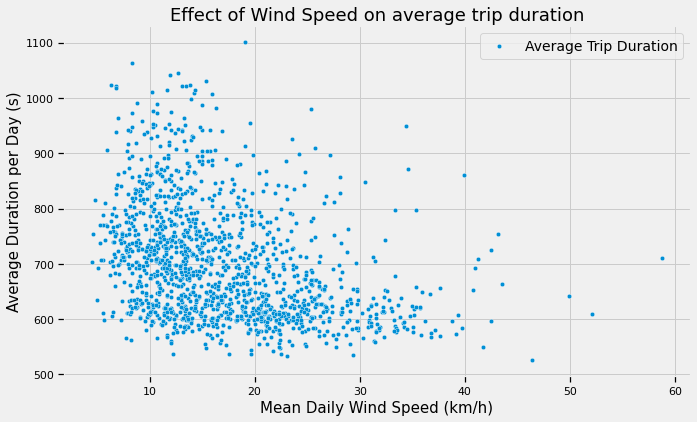

In [ ]:
# Plot of daily average trip duration versus wind speed
duration_weather_plot('wind_speed', 'duration')

### 5.3.6 Visibility

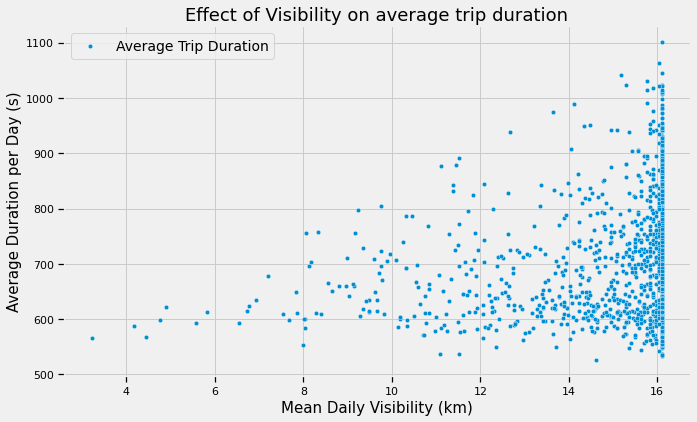

In [ ]:
# Plot of average trip duration versus visibility
duration_weather_plot('visibility', 'duration')

### 5.3.7 Humidex

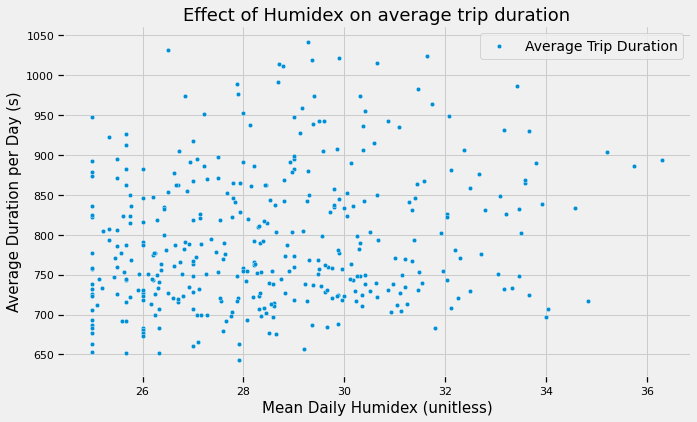

In [ ]:
# Plot of average trip duration versus humidex
duration_weather_plot('humidex', 'duration')

### 5.3.8 Wind Chill

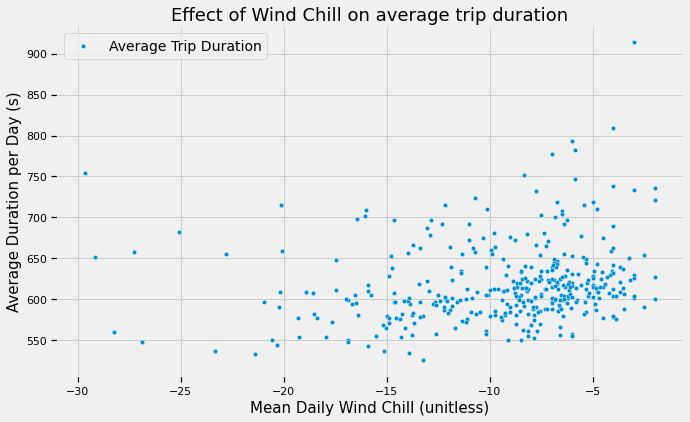

In [ ]:
# Plot of average trip duration versus wind chill
duration_weather_plot('wind_chill', 'duration')

### 5.3.9 Wind Direction

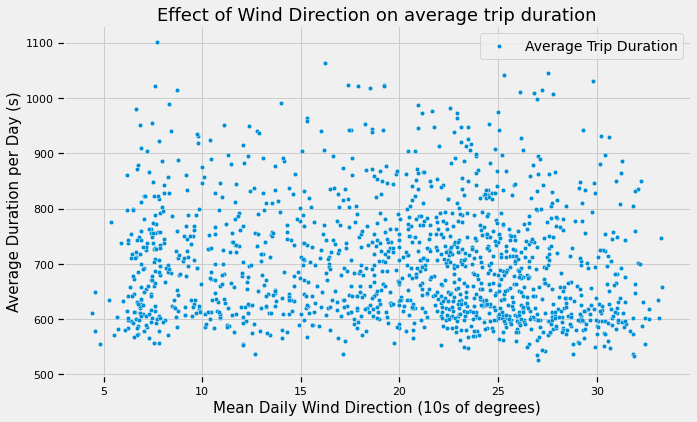

In [ ]:
# Plot of average trip duration versus wind direction
duration_weather_plot('wind_direction', 'duration')

The general trend of different weather features on trip duration is the same as ride number.

Overall, it is clear that air temperature, dew temperature, wind speed, visibility, observable weather condition, and wind chill affect the number of rides and trip duration the most. Wind chill is derived from temperature and wind speed; visibility correlates with observable weather condition (visibility decreases with fog, rain, snow, etc.); dew temperature is also derived from temperature; therefore, the ultimate determining factors are temperature, wind speed, and weather condition. 

# 6 Effects of proximity to TTC subway stations

## 6.1 Prepare geographic data

In [ ]:
# Load subway station locations
subway_stations = gpd.read_file('/content/drive/My Drive/CIV1498 Project 2021/subway_stations.shp').to_crs(epsg=26917)

subway_stations.head()

,STATION,LINE,PLATFORM_L,AVG_PASSEN,LINE2,PLATFORM_1,SUBWAY_TRA,ADDRESS,Opened,geometry
0,Kipling,Bloor-Danforth,1,53640,None,None,False,5247 Dundas St. West,1980,POINT (618101.613 4832636.300)
1,Islington,Bloor-Danforth,1,43090,None,None,False,3286 Bloor St. West,1968,POINT (618990.613 4833544.113)
2,Royal York,Bloor-Danforth,2,19440,None,None,False,3012 Bloor St. West,1968,POINT (620056.496 4833882.764)
3,Old Mill,Bloor-Danforth,2,5780,None,None,False,2672 Bloor St. West,1968,POINT (621361.678 4834111.901)
4,Jane,Bloor-Danforth,2,16730,None,None,False,2440 Bloor St. West,1968,POINT (622220.664 4834091.381)


In [ ]:
# Creat a 200 meter buffer for subway stations
subway_stations_buffer = subway_stations['geometry'].buffer(200)

subway_stations_buffer.head()

0    POLYGON ((618301.613 4832636.300, 618300.650 4...
1    POLYGON ((619190.613 4833544.113, 619189.650 4...
2    POLYGON ((620256.496 4833882.764, 620255.533 4...
3    POLYGON ((621561.678 4834111.901, 621560.714 4...
4    POLYGON ((622420.664 4834091.381, 622419.701 4...
dtype: geometry

In [ ]:
# Creat the union of subway station buffer
subway_station_union = subway_stations_buffer.geometry.unary_union

In [ ]:
# Add a column of subway access to bikeshare_stations_gdf
bikeshare_stations_gdf['subway_access'] = bikeshare_stations_gdf.apply(lambda x: subway_station_union.contains(x['geometry']),axis=1)

bikeshare_stations_gdf.head()

,Station Id,Station Name,lat,lon,capacity,geometry,rides_start,rides_end,duration_sum_start,duration_sum_end,neighbourhood,subway_access
0,7000,Fort York Blvd / Capreol Ct,43.639832,-79.395954,35,POINT (629379.194 4833121.050),54040,50623,39931278.0,38990223.0,Waterfront Communities-The Island,False
1,7001,Lower Jarvis St / The Esplanade,43.647830,-79.370698,15,POINT (631398.881 4834049.011),28449,34316,21834331.0,26158138.0,Waterfront Communities-The Island,False
2,7002,St. George St / Bloor St W,43.667333,-79.399429,19,POINT (629039.989 4836169.986),42251,38180,26474205.0,24457748.0,University,True
3,7003,Madison Ave / Bloor St W,43.667158,-79.402761,15,POINT (628771.730 4836145.373),26481,22842,18284444.0,15924287.0,Annex,True
4,7004,University Ave / Elm St,43.656518,-79.389099,11,POINT (629896.139 4834984.957),23407,22700,14299107.0,13818287.0,Kensington-Chinatown,True


In [ ]:
# Plot subway station buffer and bike stations
from folium import GeoJson

# Create a base map
map_6_1 = folium.Map(location=[43.7000, -79.3871], tiles='cartodbpositron', zoom_start=11.4)

# Add each polygon on the map
GeoJson(subway_stations_buffer.to_crs(epsg=4326)).add_to(map_6_1)

# Add points for bike station
for idx, row in bikeshare_stations_gdf.to_crs(epsg=4326).iterrows():
    if row['subway_access']:
        folium.Circle(location=[row.geometry.y, row.geometry.x], radius=20, color='red').add_to(map_6_1)
    else:
        folium.Circle(location=[row.geometry.y, row.geometry.x], radius=20, color='black').add_to(map_6_1)

map_6_1

**Legend:**

*Blue*: subway stations

*Red*: bike stations within buffer zone

*Black*: bike stations outside buffer zone

In [ ]:
# Calculate the percentage of bike stations that are close to a subway station
subway_access = round(sum(bikeshare_stations_gdf['subway_access'])/len(bikeshare_stations_gdf),3)*100
print('{} % of bikeshare stations are within 200 metres of a subway station.'.format(subway_access))

16.7 % of bikeshare stations are within 200 metres of a subway station.


## 6.2 Effects of subway access on usage

### 6.2.1 Effects on number of rides

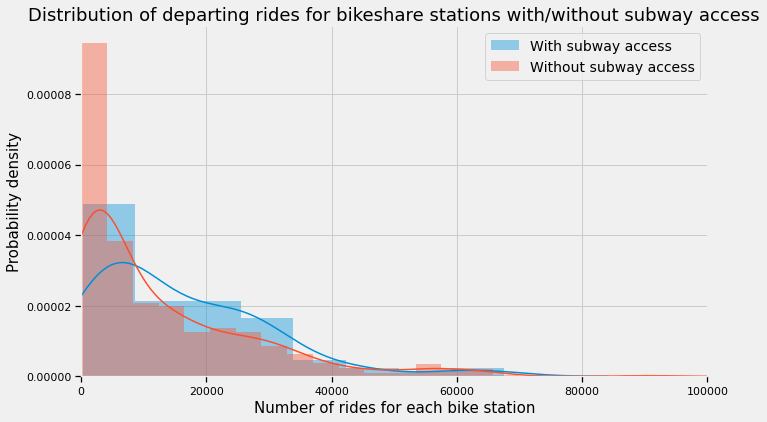

In [ ]:
# Distribution of departing rides for bike stations with/without subway access
plt.figure(figsize=(10, 6))
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_start'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == True)]['rides_start'],
                                    label = 'With subway access')
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_start'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == False)]['rides_start'],
                                    label = 'Without subway access')
plt.xlabel('Number of rides for each bike station', fontsize=15)
plt.ylabel('Probability density', fontsize=15)
plt.title('Distribution of departing rides for bikeshare stations with/without subway access', fontsize=18)
plt.xlim(0, 100000)
plt.ticklabel_format(style='plain', axis='y')
plt.legend(fontsize = 14);

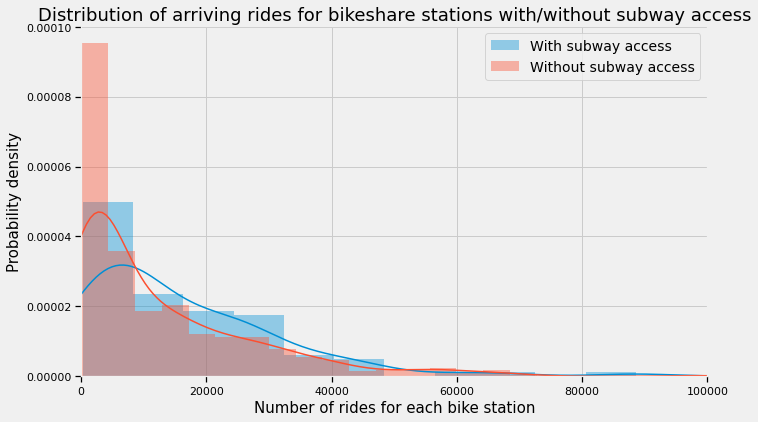

In [ ]:
# Distribution of arriving rides for bike stations with/without subway access
plt.figure(figsize=(10, 6))
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_end'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == True)]['rides_end'],
                                    label = 'With subway access')
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_end'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == False)]['rides_end'],
                                    label = 'Without subway access')
plt.xlabel('Number of rides for each bike station', fontsize=15)
plt.ylabel('Probability density', fontsize=15)
plt.title('Distribution of arriving rides for bikeshare stations with/without subway access', fontsize=18)
plt.xlim(0, 100000)
plt.legend(fontsize = 14);

In [ ]:
# Percentage of near subway rides
total_rides = bikeshare_stations_gdf['rides_start'].sum()
near_subway_rides_start = bikeshare_stations_gdf[bikeshare_stations_gdf['subway_access'] == True]['rides_start'].sum()
near_subway_rides_end = bikeshare_stations_gdf[bikeshare_stations_gdf['subway_access'] == True]['rides_end'].sum()
print('{} % of rides start at stations that are within 200 metres of a subway station.'.format(round(near_subway_rides_start/total_rides*100,2)))
print('{} % of rides end at stations that are within 200 metres of a subway station.'.format(round(near_subway_rides_end/total_rides*100,2)))

19.94 % of rides start at stations that are within 200 metres of a subway station.
20.11 % of rides end at stations that are within 200 metres of a subway station.


### 6.2.2 Effects on trip duration

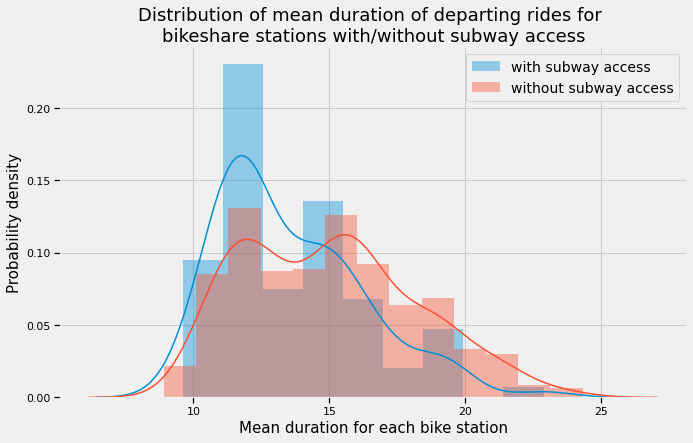

In [ ]:
bikeshare_stations_gdf['duration_mean_start'] = bikeshare_stations_gdf['duration_sum_start']/bikeshare_stations_gdf['rides_start']

# Distribution of mean duration of departing rides for bike stations with/without subway access
plt.figure(figsize=(10, 6))
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_start'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == True)]['duration_mean_start']/60,
                                    label = 'with subway access')
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_start'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == False)]['duration_mean_start']/60,
                                    label = 'without subway access')
plt.xlabel('Mean duration for each bike station', fontsize=15)
plt.ylabel('Probability density', fontsize=15)
plt.title('Distribution of mean duration of departing rides for \nbikeshare stations with/without subway access', fontsize=18)
plt.legend(fontsize = 14);

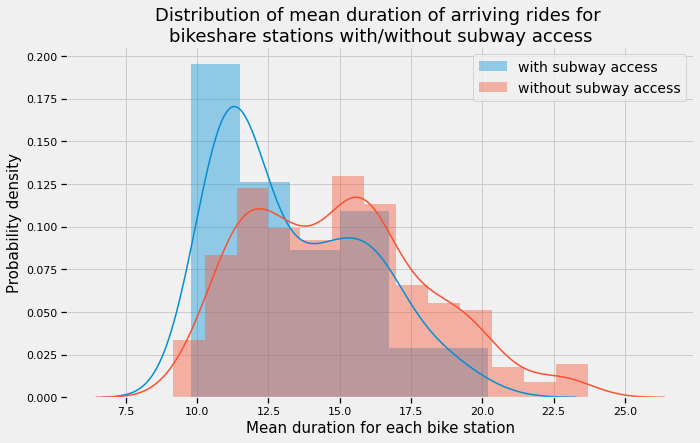

In [ ]:
bikeshare_stations_gdf['duration_mean_end'] = bikeshare_stations_gdf['duration_sum_end']/bikeshare_stations_gdf['rides_end']

# Distribution of mean duration of arriving rides for bike stations with/without subway access
plt.figure(figsize=(10, 6))
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_end'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == True)]['duration_mean_end']/60,
                                    label = 'with subway access')
sns.distplot(bikeshare_stations_gdf[(bikeshare_stations_gdf['rides_end'] > 0) & 
                                    (bikeshare_stations_gdf['subway_access'] == False)]['duration_mean_end']/60,
                                    label = 'without subway access')
plt.xlabel('Mean duration for each bike station', fontsize=15)
plt.ylabel('Probability density', fontsize=15)
plt.title('Distribution of mean duration of arriving rides for \nbikeshare stations with/without subway access', fontsize=18)
plt.legend(fontsize = 14);

Bikeshare stations that are close to subway stations tend to have higher demands and shorter ride durations. There is no obvious difference between departing and arriving rides from the plots above. People who use shared bikes as an extension of subways for commuting also tend to ride to get access to subways.

# 7 Impact of COVID

On March 17, 2020, Ontario Premier Ford declared a provincial state of emergency, and the Ontario government extended the state of emergency through April 13, 2020. Let's investigate the impact of the city closure.

## 7.1 Create filters for the study period for 4 years

In [ ]:
# Filter one: 2017-03-17  to  2017-04-13
filter_1 = (data_merged2.index > '2017-03-17')&(data_merged2.index < '2017-04-13')
period_2017 = data_merged2[filter_1]

# Filter two: 2018-03-17 to 2018-04-13
filter_2 = (data_merged2.index > '2018-03-17')&(data_merged2.index < '2018-04-13')
period_2018 = data_merged2[filter_2]

# Filter two: 2019-03-17 to 2019-04-13
filter_3 = (data_merged2.index > '2019-03-17')&(data_merged2.index < '2019-04-13')
period_2019 = data_merged2[filter_3]

# Filter two: 2020-03-17 to 2020-04-13
filter_4 = (data_merged2.index > '2020-03-17')&(data_merged2.index < '2020-04-13')
period_2020 = data_merged2[filter_4]

## 7.2 Aggregate the rides data in the level of days

In [ ]:
# 2017
period_2017_day = period_2017.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()

# 2018
period_2018_day = period_2018.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()
# 2019
period_2019_day = period_2019.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()
# 2020
period_2020_day = period_2020.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()

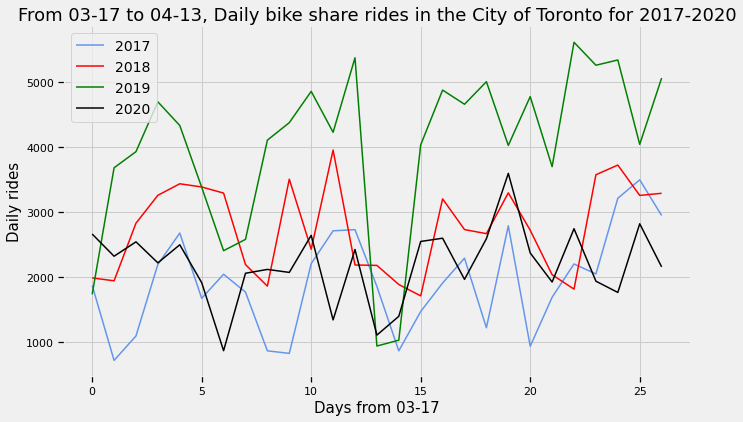

In [ ]:
# Plot daily rides
plt.figure(figsize=(10, 6))
plt.title('From 03-17 to 04-13, Daily bike share rides in the City of Toronto for 2017-2020', fontsize=18)
ax = sns.lineplot(period_2017_day.index, period_2017_day['rides'], color="cornflowerblue",label='2017')
sns.lineplot(period_2018_day.index, period_2018_day['rides'], color="red",ax=ax,label='2018')
sns.lineplot(period_2019_day.index, period_2019_day['rides'], color="green",ax=ax,label='2019')
sns.lineplot(period_2020_day.index, period_2020_day['rides'], color="black",ax=ax,label='2020')
plt.xlabel('Days from 03-17', fontsize=15)
plt.ylabel('Daily rides', fontsize=15)
plt.legend(fontsize = 14)
plt.show()

From the plot above, it can be seen that the daily rides data for 2020 do not have too many differences compared to 2017 and 2018, while the number of daily rides in these three years all vary between 1000 to 3000. However, the daily rides in 2020 in the specific study period faced a huge decrease compared to 2019. In 2019, the highest daily rides during the study period happened on the 29th day from March 17, and it reached above 5000 rides per day, while the highest daily rides for 2020 was 3500 rides per day.

In [ ]:
print('the average daily rides during the study period in 2017 is: ', int(period_2017_day['rides'].mean()),'rides/day. ')
print('the average daily rides during the study period in 2018 is: ', int(period_2018_day['rides'].mean()),'rides/day. ')
print('the average daily rides during the study period in 2019 is: ', int(period_2019_day['rides'].mean()),'rides/day. ')
print('the average daily rides during the study period in 2020 is: ', int(period_2020_day['rides'].mean()),'rides/day. ')

the average daily rides during the study period in 2017 is:  1932 rides/day. 
the average daily rides during the study period in 2018 is:  2748 rides/day. 
the average daily rides during the study period in 2019 is:  3996 rides/day. 
the average daily rides during the study period in 2020 is:  2187 rides/day. 


Based on the average daily rides during the study period, the state of emergency did affect daily rides.

Let's investigate the effect of Covid on different types of members.

## 7.3 Effect of Covid on different types of members

In [ ]:
# Combine the dataframes from the 4 years together
period_4_year = pd.concat([period_2017_day,period_2018_day,period_2019_day,period_2020_day],ignore_index=True)

# Extract the year infomation from the time stamps
period_4_year['year'] = period_4_year['Start Time'].dt.year
period_4_year.head()

,Start Time,rides,daily_duration,annual_members,casual_members,year
0,2017-03-17 00:00:00-05:00,1867,615.595072,1751,116,2017
1,2017-03-18 00:00:00-05:00,714,640.207283,679,35,2017
2,2017-03-19 00:00:00-05:00,1090,609.084404,997,93,2017
3,2017-03-20 00:00:00-05:00,2191,606.120493,2118,73,2017
4,2017-03-21 00:00:00-05:00,2672,640.491018,2536,136,2017


In [ ]:
# Define a function for year identification
def year_div(x):
  if x == 2017 or x == 2018 or x ==2019:
    return "2017-2019"
  else:
    return  '2020'

# Apply the function to the column
period_4_year['year'] = period_4_year['year'].apply(lambda row:year_div(row))

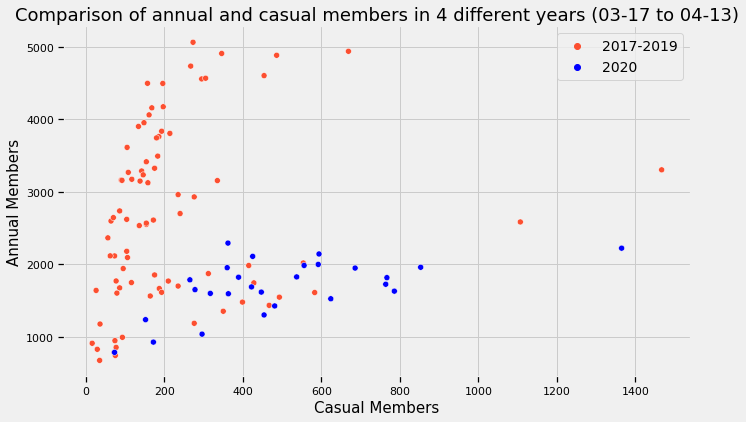

In [ ]:
# Plot the comparison scatter plot
plt.subplots(figsize = (10,6))
plt.title('Comparison of annual and casual members in 4 different years (03-17 to 04-13)', fontsize=18)
palette ={'2017-2019': "C1",'2020': "B"}
sns.scatterplot(data=period_4_year, x="casual_members", y="annual_members", hue='year',palette=palette)
plt.xlabel('Casual Members', fontsize = 15)
plt.ylabel('Annual Members', fontsize = 15)
plt.legend(fontsize = 14);

Comparing to the 3 other years, 2020 has an obvious loss in terms of daily rides by annual members, while the casual members were not affected as much. Due to the pandemic, many workers work from home, so they are not using the bikes as often, or they may have even cancelled their membership.

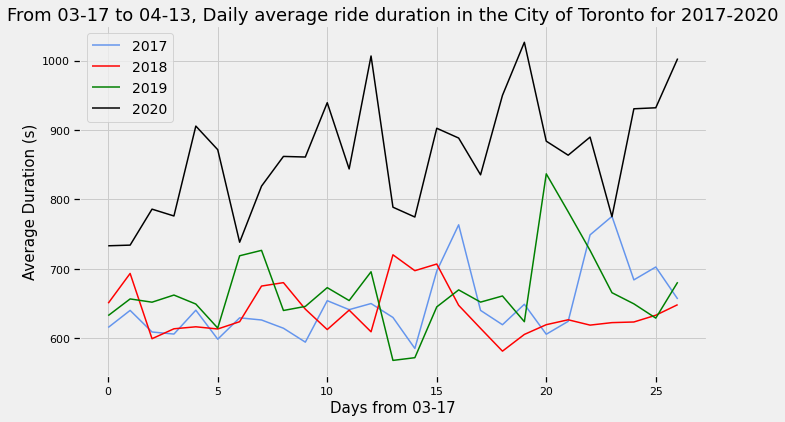

In [ ]:
# Plot daily average ride duration
plt.figure(figsize=(10, 6))
plt.title('From 03-17 to 04-13, Daily average ride duration in the City of Toronto for 2017-2020', fontsize=18)
ax = sns.lineplot(period_2017_day.index, period_2017_day['daily_duration'], color="cornflowerblue",label='2017')
sns.lineplot(period_2018_day.index, period_2018_day['daily_duration'], color="red",ax=ax,label='2018')
sns.lineplot(period_2019_day.index, period_2019_day['daily_duration'], color="green",ax=ax,label='2019')
sns.lineplot(period_2020_day.index, period_2020_day['daily_duration'], color="black",ax=ax,label='2020')
plt.xlabel('Days from 03-17', fontsize=15)
plt.ylabel('Average Duration (s)', fontsize=15)
plt.legend(fontsize = 14)
plt.show()

From the plot above, it can be found that the average duration during the lockdown hugely surpassed those average duration times from previous years. Combining with the scatter plot above, some casual members may have still chosen to go bike riding during the lockdown; thereby, increasing the average duration.

What about after lockdown?

In [ ]:
# Filter one: 2017-03-17 to 2017-06-13
filter_1 = (data_merged2.index > '2017-03-17')&(data_merged2.index < '2017-06-13')
period_2017 = data_merged2[filter_1]

# Filter two: 2018-03-17 to 2018-04-13
filter_2 = (data_merged2.index > '2018-03-17')&(data_merged2.index < '2018-06-13')
period_2018 = data_merged2[filter_2]

# Filter two: 2019-03-17 to 2019-04-13
filter_3 = (data_merged2.index > '2019-03-17')&(data_merged2.index < '2019-06-13')
period_2019 = data_merged2[filter_3]

# Filter two: 2020-03-17 to 2020-04-13
filter_4 = (data_merged2.index > '2020-03-17')&(data_merged2.index < '2020-06-13')
period_2020 = data_merged2[filter_4]

In [ ]:
# 2017
period_2017_day = period_2017.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()

# 2018
period_2018_day = period_2018.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()
# 2019
period_2019_day = period_2019.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()
# 2020
period_2020_day = period_2020.groupby(pd.Grouper(freq='D')).agg(rides = ('Trip Id', 'count'),
                                                                daily_duration = ('Trip Duration','mean'),
                                                           annual_members = ('User Type', lambda x: sum((x == 'Annual Member') | (x == 'Member'))),
                                                           casual_members = ('User Type', lambda x: sum((x == 'Casual Member') | (x == 'Casual')))).reset_index()

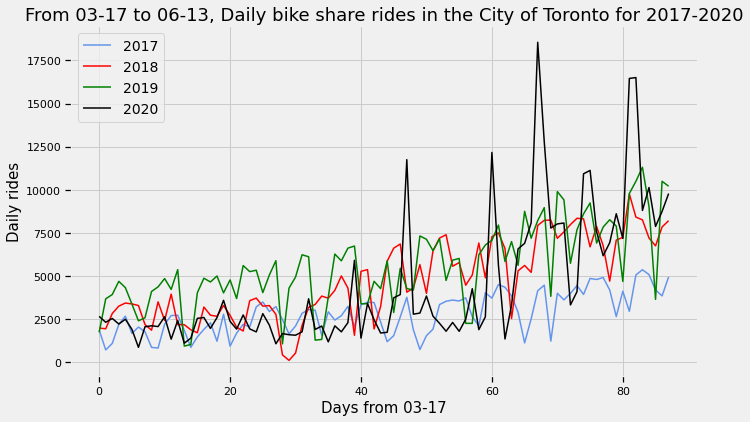

In [ ]:
# Plot daily rides
plt.figure(figsize=(10, 6))
plt.title('From 03-17 to 06-13, Daily bike share rides in the City of Toronto for 2017-2020', fontsize=18)
ax = sns.lineplot(period_2017_day.index, period_2017_day['rides'], color="cornflowerblue",label='2017')
sns.lineplot(period_2018_day.index, period_2018_day['rides'], color="red",ax=ax,label='2018')
sns.lineplot(period_2019_day.index, period_2019_day['rides'], color="green",ax=ax,label='2019')
sns.lineplot(period_2020_day.index, period_2020_day['rides'], color="black",ax=ax,label='2020')
plt.xlabel('Days from 03-17', fontsize=15)
plt.ylabel('Daily rides', fontsize=15)
plt.legend(fontsize = 14)
plt.show()

After lockdown, the daily rides of 2020 started to increase to the normal level, which is generally higher than the daily rides of 2019.

In [ ]:
# Combine the dataframes from the 4 years together
period_4_year = pd.concat([period_2017_day,period_2018_day,period_2019_day,period_2020_day],ignore_index=True)

# Extract the year infomation from the time stamps
period_4_year['year'] = period_4_year['Start Time'].dt.year
period_4_year.head()

# Apply the function to the column
period_4_year['year'] = period_4_year['year'].apply(lambda row:year_div(row))

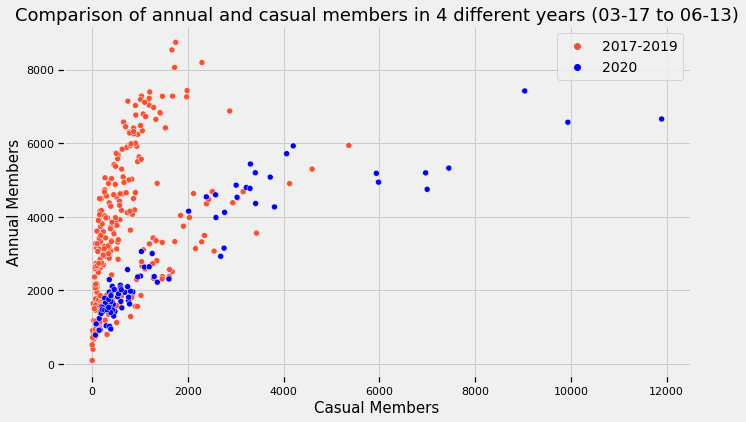

In [ ]:
# Plot the comparison scatter plot
plt.subplots(figsize = (10,6))
plt.title('Comparison of annual and casual members in 4 different years (03-17 to 06-13)', fontsize=18)
palette ={'2017-2019': "C1",'2020': "B"}
sns.scatterplot(data=period_4_year, x="casual_members", y="annual_members", hue='year',palette=palette)
plt.xlabel('Casual Members', fontsize = 15)
plt.ylabel('Annual Members', fontsize = 15)
plt.legend(fontsize = 14);

The number of rides for annual and casual memberships have increased from the March 17 to June 13 period compared to the March 17 to April 13 period.